<h1>Laboratorio 2. Regresión</h1>
<h2>Grupo 2</h2>
<h3>Natalia Ortega (sección 4), David Leon (sección 3) & Juan Camilo Mercado (sección 4)</h3>

<strong><h4>0. Carga de librerías necesarias para implementación y carga de datos</h4></strong>

Carga de las librerías

In [1]:
import numpy as np
import pandas as pd
import os

from joblib import dump, load

import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import warnings

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.stats.stattools import durbin_watson

import scipy.stats as stats

C:\Users\CAMILO\AppData\Local\Temp\ipykernel_34456\4013210796.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Carga de los archivos

In [2]:
df_train = pd.read_csv('data/202410_Laboratorio 2 - Regresión_train_data.csv')
df_train_original = df_train.copy()
df_test = pd.read_csv('data/202410_Laboratorio 2 - Regresión_val_data.csv')
df_dict = pd.read_csv('data/dict.csv', sep=';', encoding="ISO-8859-1")

Se suprimen warnings sobre el layout de las figuras para mejorar la presentación del Notebook.

In [3]:
warnings.filterwarnings("ignore", message="The figure layout has changed to tight")
warnings.filterwarnings("ignore", message="Calling float on a single element Series is deprecated")

<strong><h4>1. Entendimiento de datos</h4></strong>

Para entender los datos se considera importante entender la cantidad de datos que se tiene, verificar cuantas columnas y filas tienen los datos proporcionados

In [4]:
df_dim = df_train.shape
print(">> El dataframe de entrenamiento contiene {} columnas y {} filas\n".format(
    df_dim[1], df_dim[0]))
print(">> El dataframe se ve de la siguiente forma: ")
df_train.head()

>> El dataframe de entrenamiento contiene 34 columnas y 2132 filas

>> El dataframe se ve de la siguiente forma: 


,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,deathRate
0,37.0,13,521.9,36836,4201,18.3,0.0,"(34218.1, 37413.8]",47.5,44.9,...,30.2,43.2,20.0,88.570752,0.118315,1.135826,0.141978,47.157360,10.704225,169.4
1,107.0,37,412.7,48683,20455,11.7,0.0,"(48021.6, 51046.4]",43.1,42.4,...,44.4,35.7,17.8,97.797657,0.486169,0.116680,0.486169,53.723161,6.550868,131.8
2,22.0,12,472.9,60946,3294,7.4,0.0,"(54545.6, 61494.5]",43.6,43.4,...,48.6,24.5,5.7,95.560385,0.124185,0.000000,2.390562,55.846042,9.935897,209.3
3,20.0,10,527.2,29477,2302,29.5,0.0,"[22640, 34218.1]",49.2,46.8,...,24.7,53.6,27.8,49.613070,49.226139,0.386930,0.000000,38.522167,8.616188,250.0
4,56.0,19,446.4,38478,11310,23.6,0.0,"(37413.8, 40362.7]",37.5,37.4,...,29.8,35.5,20.6,88.516367,0.079197,0.167195,4.593453,52.379740,9.079392,152.5


In [5]:
df_dim2 = df_test.shape
print(">> El dataframe de test contiene {} columnas y {} filas\n".format(
    df_dim2[1], df_dim[0]))
print(">> El dataframe se ve de la siguiente forma: ")
df_test.head()

>> El dataframe de test contiene 33 columnas y 2132 filas

>> El dataframe se ve de la siguiente forma: 


,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,250.0,97,461.8,37782,41516,23.2,0.000000,"(37413.8, 40362.7]",42.6,42.2,...,35.0,28.3,46.4,28.7,75.106455,0.616955,0.866157,8.356721,51.013900,4.204317
1,938.0,334,444.5,72973,224469,5.8,280.662363,"(61494.5, 125635]",38.7,37.3,...,71.4,64.9,20.8,9.6,89.673330,3.456320,4.511723,0.631605,63.683814,4.708367
2,29.0,16,372.0,36566,5651,20.9,0.000000,"(34218.1, 37413.8]",42.3,39.8,...,NaN,25.8,41.5,22.3,71.920165,0.481762,0.172058,1.531315,49.431818,4.588745
3,29.0,9,537.2,43523,7121,12.4,0.000000,"(42724.4, 45201]",30.7,29.1,...,43.7,36.6,30.0,21.8,88.979184,1.254634,0.969490,4.348446,49.512411,9.422492
4,499.0,215,457.8,40921,79545,20.2,0.000000,"(40362.7, 42724.4]",43.4,41.4,...,NaN,33.4,39.3,21.8,89.311026,6.803685,0.592285,1.157993,55.248489,5.769696


In [6]:
train_columns = set(df_train.columns)
test_columns = set(df_test.columns)

mark = train_columns - test_columns
print(f">> La columna que el set de entrenamiento tiene y no test es: {mark}, siendo esta la columna de etiquetado, siendo coherente al enunciado, pues esta es la variable a determinar usando el modelo y buscado por la organización.")

>> La columna que el set de entrenamiento tiene y no test es: {'deathRate'}, siendo esta la columna de etiquetado, siendo coherente al enunciado, pues esta es la variable a determinar usando el modelo y buscado por la organización.


Igualmente, es importante entender de qué se trata cada columna, por lo tanto, para entender los datos de mejor forma, es se busca entender qué significa cada uno de estos con el diccionario proporcionado.

In [7]:
pd.set_option('display.max_colwidth', None)
print(">> El diccionario de datos es el siguiente: ")
df_dict

>> El diccionario de datos es el siguiente: 


,Atributo,Descripcion
0,deathRate,Muertes promedio de cancer por cada 100.000 habitantes
1,avgAnnCount,Numero promedio de casos diagnosticados de cancer reportados anualmente
2,avgDeathsPerYear,Numero promedio de muertes reportadas por cancer
3,incidenceRate,Numero de diagnosticos promedio de cancer por cada 100.000 habitantes.
4,medianIncome,Ingreso mediano por condado
5,poEst2015,Poblacion del condado
6,povertyPercent,Porcentaje de la poblacion en la pobreza
7,studyPerCap,Numero de ensayos clinicos relacionados con el cancer por condado
8,binedInc,Ingreso mediano per capita (clasificado por decil)
9,MedianAge,Edad mediana de los residentes del condado


<h5>1.1. Entendimiento del contenido</h5>

Es necesario analizar todos los datos para comprender cómo cada variable se relaciona entre sí. Al examinar el conjunto de datos completo, podemos obtener información sobre los patrones generales y las relaciones entre diferentes variables. Este análisis exhaustivo permite identificar tendencias, correlaciones y posibles valores atípicos que pueden afectar nuestro proceso de análisis y toma de decisiones. Por lo tanto, es crucial explorar y visualizar los datos de manera integral para obtener una comprensión completa de las relaciones entre las variables.

In [8]:
print(">> Se puede observar la información detallada de cada columna:\n")
df_train.info()

>> Se puede observar la información detallada de cada columna:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2132 entries, 0 to 2131
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              2132 non-null   float64
 1   avgDeathsPerYear         2132 non-null   int64  
 2   incidenceRate            2132 non-null   float64
 3   medIncome                2132 non-null   int64  
 4   popEst2015               2132 non-null   int64  
 5   povertyPercent           2132 non-null   float64
 6   studyPerCap              2132 non-null   float64
 7   binnedInc                2132 non-null   object 
 8   MedianAge                2132 non-null   float64
 9   MedianAgeMale            2132 non-null   float64
 10  MedianAgeFemale          2132 non-null   float64
 11  Geography                2132 non-null   object 
 12  AvgHouseholdSize         2132 non-null   float64
 13  PercentMarried

Se observa que los tipos de datos son coherentes con las definiciones del diccionario, pues, los datos de tipo objeto corresponden a una variable de un rango y una variable categórica, la cuál no es significativa para la predicción al no poderse transformar en numérica de forma correcta, e, igualmente no va alineada al propósito del ejercicio.

In [9]:
df_train = df_train.drop('Geography', axis=1)

Igualmente, al analizar inicialmente los datos se observa que tienen escalas muy diferentes que no permiten la visualización correcta de estos, por lo que se separan las columnas

In [10]:
columns_to_exclude = ['popEst2015', 'medIncome', 'avgAnnCount', 'avgDeathsPerYear', 'povertyPercent', 'studyPerCap']
columns_to_visualize = [col for col in df_train.columns if col not in columns_to_exclude]

fig = plt.figure(figsize=(50, 30))
ax = sns.boxplot(data=df_train[columns_to_visualize], orient="v")
print(">> Se visualizan los datos en conjunto: ")
plt.show()

>> Se visualizan los datos en conjunto: 


Se observan las columnas de porcentajes únicamente para observar sus valores:

>> Se visualizan los datos en conjunto: 


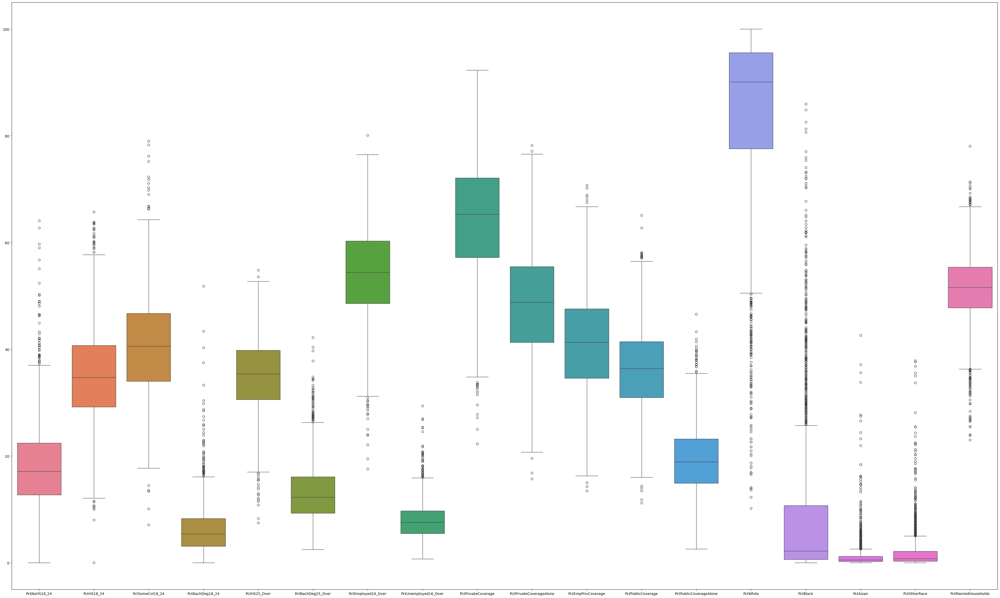

In [ ]:
columns_pct = [col for col in df_train.columns if 'Pct' in col]

fig = plt.figure(figsize=(50, 30))
ax = sns.boxplot(data=df_train[columns_pct], orient="v")
print(">> Se visualizan los datos en conjunto: ")
plt.show()

Se observa que los porcentajes están en la escala de 0 a 100, pero se tienen outliers entre estos.

Con la variación de escalas se dificulta la visualización, por lo que se busca ver todas las variables normalizadas para hacer análisis sobre los diagramas de caja y bogotes de cada variable

>> Se visualizan los datos en conjunto: 


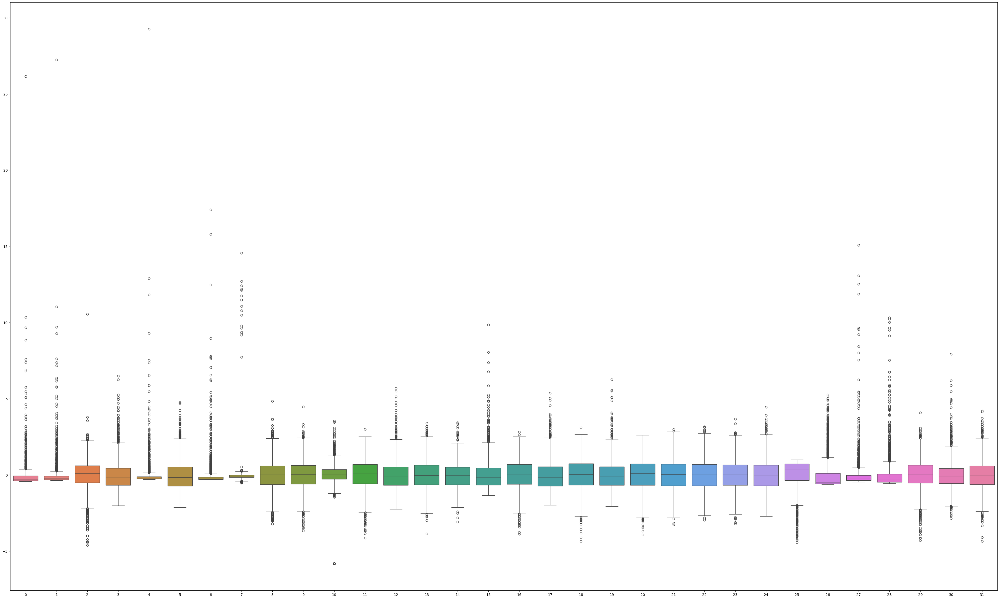

In [ ]:

scaler = StandardScaler()
numeric_columns = df_train.select_dtypes(include=[np.number]).columns
df_train_normalized = scaler.fit_transform(df_train[numeric_columns])

fig = plt.figure(figsize=(50, 30))
ax = sns.boxplot(data=df_train_normalized, orient="v")
print(">> Se visualizan los datos en conjunto: ")
plt.show()

Se puede observar la existencia de Outliers, ya que independiente de la escala estos valores exceden 1.5 veces el rango intercuartil, y, al trabajar con algoritmos de regresión lineal cuando hay outliers en los datos, la línea de regresión puede verse afectada de varias maneras, incluyendo la influencia devaluativa en la pendiente, pues, los outliers pueden tener un efecto desproporcionado en la estimación de la pendiente de la línea de regresión. Si un outlier tiene un valor extremadamente alto o bajo, arrastra la línea de regresión hacia arriba o hacia abajo, lo que resulta en una pendiente que no representa adecuadamente la relación entre las variables.

Además tener estos valores influencia en la intersección ya que puede desplazar la línea de regresión, lo que resulta en una intersección que no refleja correctamente el punto donde la línea cruza el eje *y*. Todo esto haciendo que las predicciones del modelo no sean las más adecuadas, por lo tanto se considera tenerlo en cuenta para más adelante.

Es importante tener en cuenta los outliers al realizar la regresión lineal, ya que pueden distorsionar los resultados y llevar a conclusiones incorrectas. En este caso, se propone identificar y eliminar los outliers antes de realizar el análisis de regresión lineal para obtener resultados más precisos y confiables y compararlo haciendo un ajuste de normalización por medio de RobustScaler.

Habiendo observado un problema de datos atípicos se procede a separar entre la variable objetivo y las caraterísticas posibles para determinar esta variable:

In [ ]:
features = df_train.drop('deathRate', axis=1).columns.values
target = ['deathRate']

Se busca hacer un entendimiento de la variable a determinar más profundo:

In [ ]:
death_rate_stats = df_train['deathRate'].describe()
print(">> Estadísticas descriptivas de la columna 'deathRate':")
print(death_rate_stats)

>> Estadísticas descriptivas de la columna 'deathRate':
count    2132.000000
mean      179.000047
std        27.416156
min        59.700000
25%       161.875000
50%       178.550000
75%       195.300000
max       293.900000
Name: deathRate, dtype: float64


>> Se visualiza la distribución de la columna 'deathRate':


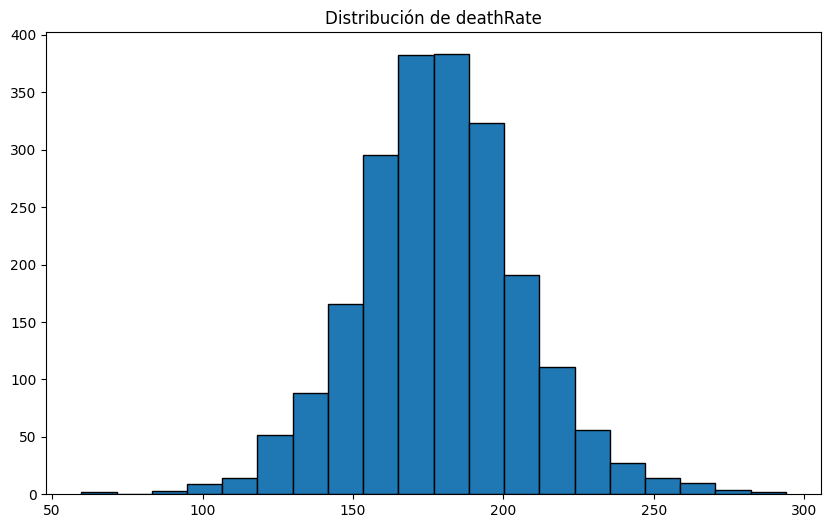

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(df_train['deathRate'], bins=20, edgecolor='black')
plt.title('Distribución de deathRate')
print(">> Se visualiza la distribución de la columna 'deathRate':")
plt.show()


>> Se visualiza el boxplot de la columna 'deathRate':


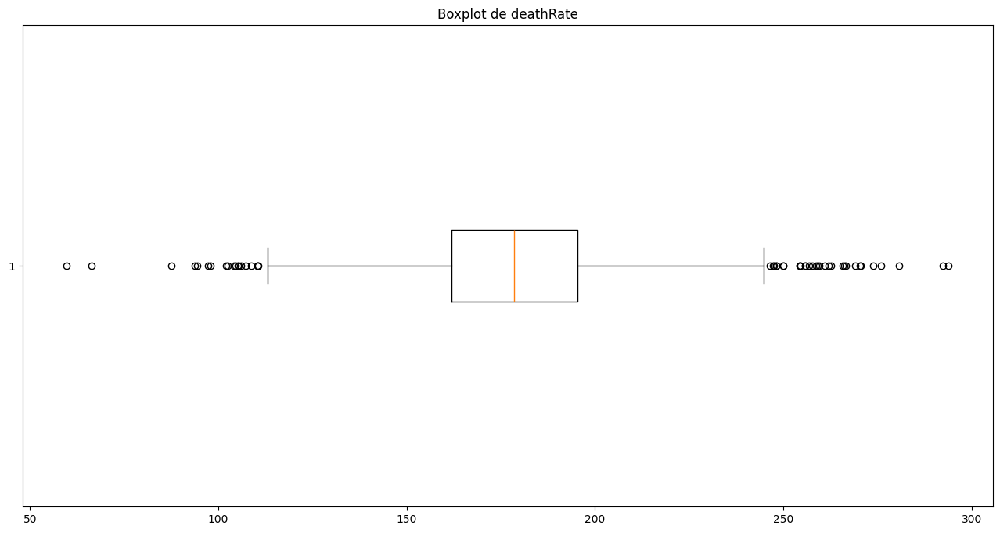

In [ ]:
plt.figure(figsize=(16, 8))
plt.boxplot(df_train['deathRate'], vert=False)
plt.title('Boxplot de deathRate')
print(">> Se visualiza el boxplot de la columna 'deathRate':")
plt.show()

>> Se visualizan los datos comparados con la variable objetivo: 


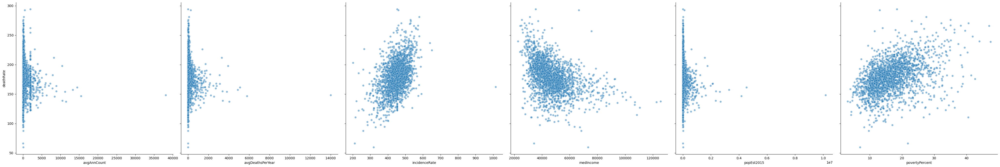

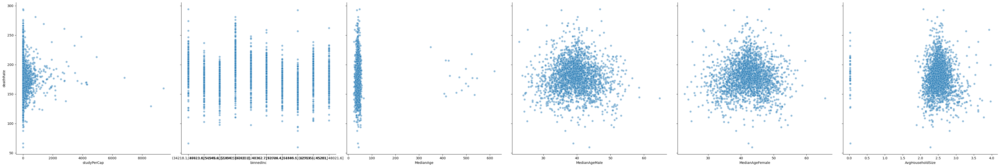

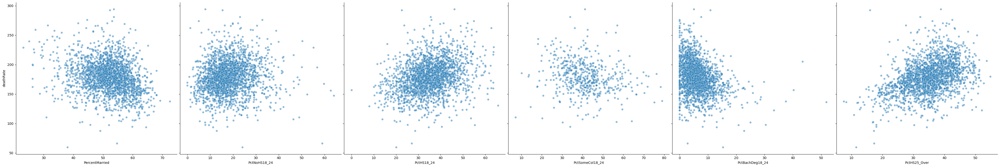

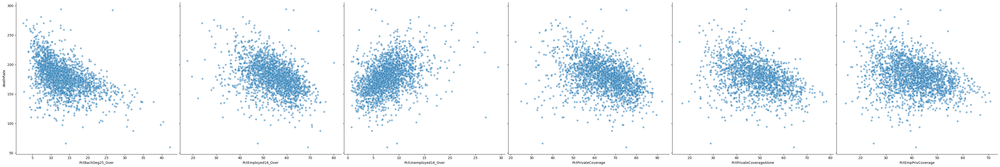

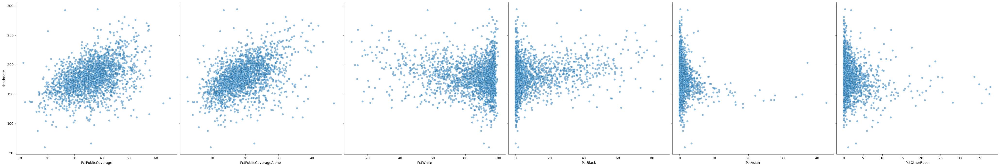

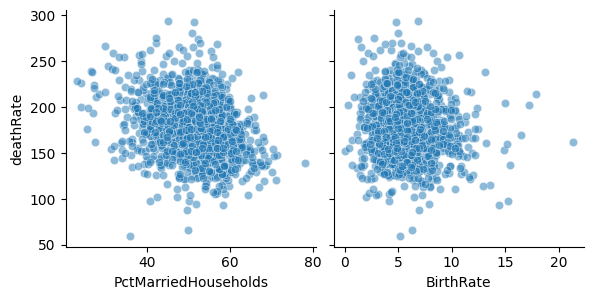

In [ ]:
print(">> Se visualizan los datos comparados con la variable objetivo: ")
sns.pairplot(df_train, height=7, y_vars=target, x_vars=features[:6], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=7, y_vars=target, x_vars=features[6:12], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=7, y_vars=target, x_vars=features[12:18], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=7, y_vars=target, x_vars=features[18:24], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=7, y_vars=target, x_vars=features[24:30], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=3, y_vars=target, x_vars=features[30:], kind="scatter", plot_kws={"alpha": 0.5})


A partir de los diagramas se observan relaciones lineales con la variable objetivo, por lo que  es posible utilizar modelos lineales.

Luego de limpiar los datos se observará nuevamente la correlación.

Se observan las correclaciones lineales entre estas variables para descartarlas como combinación para el análisis:

<Axes: >

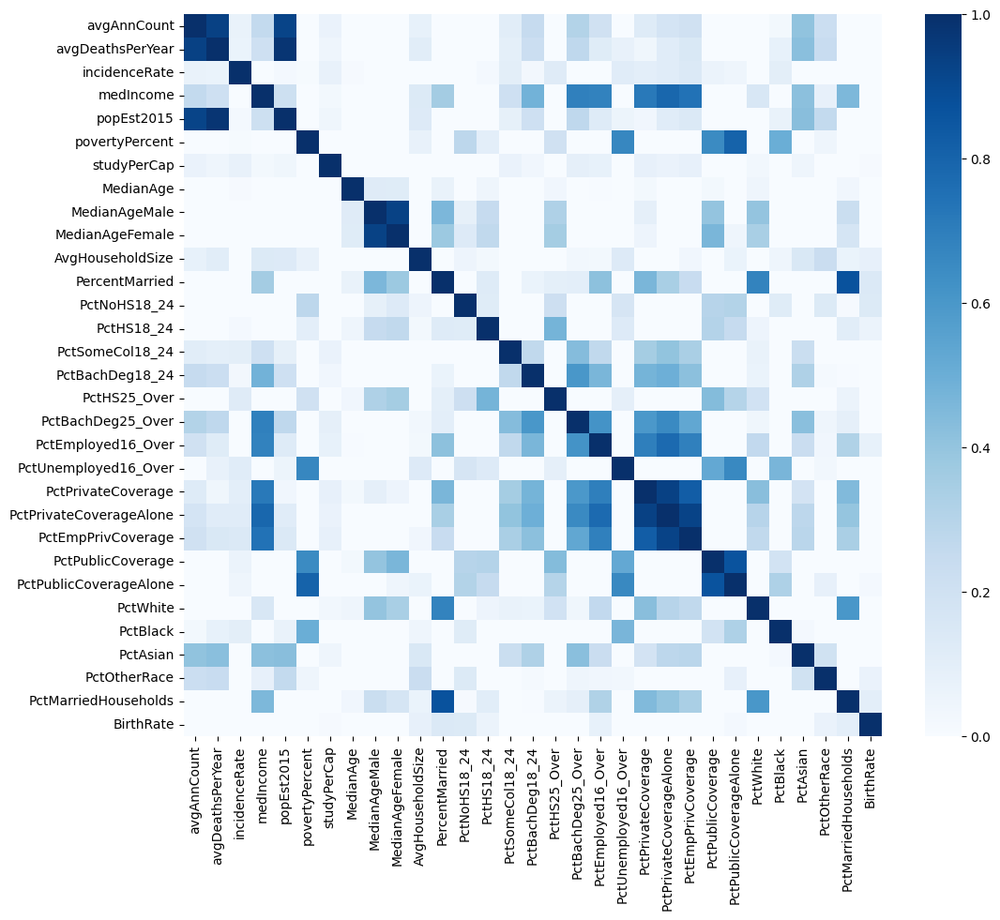

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_train[features].drop('binnedInc', axis=1).corr(), cmap="Blues", vmin=0, vmax=1)

Como se observan variables altamente correlacionadas se eliminan características a analizar según su significado y la cantidad de variables con las que se correlaciona.

<Axes: >

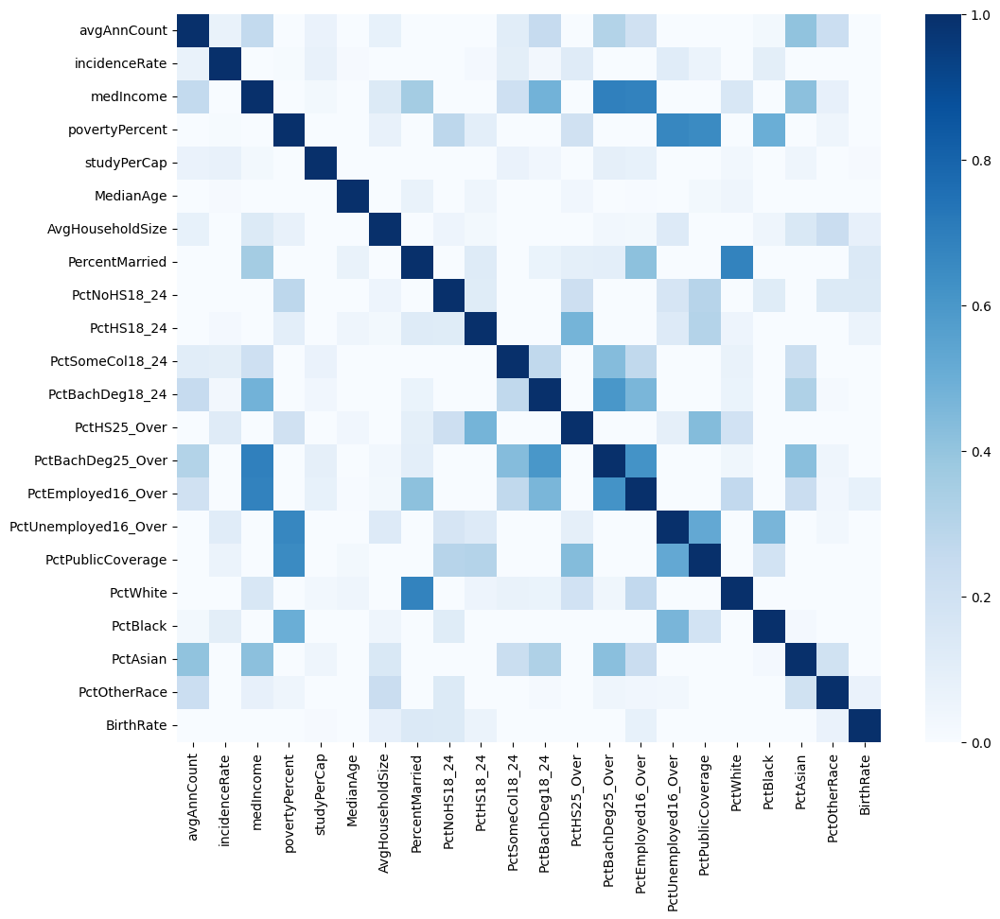

In [ ]:
features = df_train.drop(['popEst2015','PctMarriedHouseholds','MedianAgeMale','MedianAgeFemale','PctPrivateCoverage','PctPrivateCoverageAlone','PctEmpPrivCoverage','PctPublicCoverageAlone', 'avgDeathsPerYear'], axis=1).columns.values
plt.figure(figsize=(12, 10))
sns.heatmap(df_train[features].drop(['binnedInc', 'deathRate'], axis=1).corr(), cmap="Blues", vmin=0, vmax=1)

<h5>1.2. Calidad de datos</h5>

<h5><i>Completitud</i></h5>

In [ ]:
print(">> Los porcentajes de valores nulos en cada columna son los siguientes: ")
(df_train.isnull().sum()/df_dim[0]*100).sort_values(ascending=False)

>> Los porcentajes de valores nulos en cada columna son los siguientes: 


PctSomeCol18_24            75.234522
PctPrivateCoverageAlone    20.075047
PctEmployed16_Over          5.393996
avgAnnCount                 0.000000
PctPublicCoverage           0.000000
PctUnemployed16_Over        0.000000
PctPrivateCoverage          0.000000
PctEmpPrivCoverage          0.000000
PctPublicCoverageAlone      0.000000
PctHS25_Over                0.000000
PctWhite                    0.000000
PctBlack                    0.000000
PctAsian                    0.000000
PctOtherRace                0.000000
PctMarriedHouseholds        0.000000
BirthRate                   0.000000
PctBachDeg25_Over           0.000000
PctBachDeg18_24             0.000000
avgDeathsPerYear            0.000000
PctHS18_24                  0.000000
PctNoHS18_24                0.000000
PercentMarried              0.000000
AvgHouseholdSize            0.000000
MedianAgeFemale             0.000000
MedianAgeMale               0.000000
MedianAge                   0.000000
binnedInc                   0.000000
s

Se observa que los porcentajes de datos faltantes de 'PctPrivateCoverageAlone' y 'PctSomeCol18_24' superan el 20% por lo que es importante tenerlos en cuenta en la sección de limpieza de datos. Por el contrario, en el caso de 'PctEmployed16_Over' se trata al rededor de 5,39%, por lo que se considera tratar de forma especial estos datos, ya que el porcentaje es significativo.

In [ ]:
print(">> Se verifica que el número de valores nulos en PctSomeCol18_24 es",
      df_train['PctSomeCol18_24'].isnull().sum())
print(">> Se verifica que el número de valores nulos en PctPrivateCoverageAlone es",
      df_train['PctPrivateCoverageAlone'].isnull().sum())
print(">> Se verifica que el número de valores nulos en PctEmployed16_Over es",
      df_train['PctEmployed16_Over'].isnull().sum())

>> Se verifica que el número de valores nulos en PctSomeCol18_24 es 1604
>> Se verifica que el número de valores nulos en PctPrivateCoverageAlone es 428
>> Se verifica que el número de valores nulos en PctEmployed16_Over es 115


<h5><i>Unicidad</i></h5>

In [ ]:
print(">> Se observa que hay valores duplicados, hay {} datos los duplicados hay {} datos duplicados".format(
    df_train.shape[0], df_train.duplicated().sum()))

>> Se observa que hay valores duplicados, hay 2132 datos los duplicados hay 0 datos duplicados


<h5><i>Validez</i></h5>

Se verifican que los porcentajes correspondan a valores entre 0 y 100:

In [ ]:
df_train_positive = df_train.select_dtypes(include='number').copy()
columns_with_negative_values = df_train_positive.columns[df_train_positive.lt(
    0).any()]
all_positive = columns_with_negative_values.size == 0
print(">> Todos los valores son positivos:", all_positive)

>> Todos los valores son positivos: True


Se verifica que todos los valores sean positivos, pues, de lo contrario no tienen sentido

<strong><h4>2. Preparación de los datos</h4></strong>

<i><h5>Datos en rangos</i></h5>

Se sabe que los datos de la columna 'binnedInc' corresponden a valores entre rangos, y, para poder tratarlos se decido elegir como representativo  el valor medio del rango, ya que se considera que por su significado dado en el diccionario de datos la variable puede aportar al análisis de la variable de interés.

In [ ]:
df_train['binnedInc']

0       (34218.1, 37413.8]
1       (48021.6, 51046.4]
2       (54545.6, 61494.5]
3         [22640, 34218.1]
4       (37413.8, 40362.7]
               ...        
2127      [22640, 34218.1]
2128     (61494.5, 125635]
2129     (61494.5, 125635]
2130    (54545.6, 61494.5]
2131    (54545.6, 61494.5]
Name: binnedInc, Length: 2132, dtype: object

In [ ]:
df_train_temp_max = df_train['binnedInc'].apply(lambda x: x.split(',')[0])
df_train_temp_max = df_train_temp_max.apply(lambda x: x[1:]).astype(float)
df_train_temp_min = df_train['binnedInc'].apply(lambda x: x.split(',')[1])
df_train_temp_min = df_train_temp_min.apply(lambda x: x[:-1]).astype(float)
df_train['binnedInc'] = (df_train_temp_max + df_train_temp_min) / 2
df_train['binnedInc']

0       35815.95
1       49534.00
2       58020.05
3       28429.05
4       38888.25
          ...   
2127    28429.05
2128    93564.75
2129    93564.75
2130    58020.05
2131    58020.05
Name: binnedInc, Length: 2132, dtype: float64

<i><h5>Outliers</h5></i>

Se sabe que existen datos que son atípicos dentro del dataset, por lo que se decide eliminarlo con la heurística de si existen valores 1.5 veces el rango intercuartil por encima del quartil 3 o por debajo cuartil 1 corresponden a valores atípicos, por lo tanto se hace e procedimiento respectivo de calcular el rango intercuartil y eliminar todo dato que no cumpla con lo enunciado.

In [ ]:

Q1 = df_train.quantile(0.25)
Q3 = df_train.quantile(0.75)
IQR = Q3 - Q1

df_train = df_train.mask((df_train < (Q1 - (1.5 * IQR))) | (df_train > (Q3 + (1.5 * IQR))))
df_train

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,deathRate
0,37.0,13.0,521.9,36836.0,4201.0,18.3,0.000000,35815.95,47.5,44.9,...,30.2,43.2,20.0,88.570752,0.118315,1.135826,0.141978,47.157360,NaN,169.4
1,107.0,37.0,412.7,48683.0,20455.0,11.7,0.000000,49534.00,43.1,42.4,...,44.4,35.7,17.8,97.797657,0.486169,0.116680,0.486169,53.723161,6.550868,131.8
2,22.0,12.0,472.9,60946.0,3294.0,7.4,0.000000,58020.05,43.6,43.4,...,48.6,24.5,5.7,95.560385,0.124185,0.000000,2.390562,55.846042,NaN,209.3
3,20.0,10.0,527.2,29477.0,2302.0,29.5,0.000000,28429.05,49.2,46.8,...,24.7,53.6,27.8,NaN,NaN,0.386930,0.000000,38.522167,8.616188,NaN
4,56.0,19.0,446.4,38478.0,11310.0,23.6,0.000000,38888.25,37.5,37.4,...,29.8,35.5,20.6,88.516367,0.079197,0.167195,4.593453,52.379740,9.079392,152.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2127,506.0,215.0,461.3,31382.0,89208.0,30.8,44.839028,28429.05,38.7,36.5,...,30.6,43.0,26.0,NaN,NaN,1.024565,0.939553,38.665070,6.172502,194.1
2128,176.0,74.0,368.3,62752.0,47520.0,11.0,0.000000,NaN,40.4,39.3,...,47.0,27.0,12.0,93.363950,1.612868,0.263684,1.900723,61.433094,5.291214,152.8
2129,NaN,NaN,507.1,70074.0,NaN,10.7,73.449538,NaN,40.6,38.9,...,52.0,37.2,21.4,79.796923,3.912684,NaN,NaN,48.513782,4.825363,161.5
2130,378.0,157.0,400.2,55798.0,78593.0,11.7,0.000000,58020.05,41.5,40.6,...,50.2,27.2,13.0,94.254676,1.824259,0.723790,1.400013,58.197468,4.834403,156.1


Al realizar la limpieza de outliers se obtiene la nueva distribución de datos mostrada de forma normalizada por visibilidad.

>> Se visualizan los datos en conjunto: 


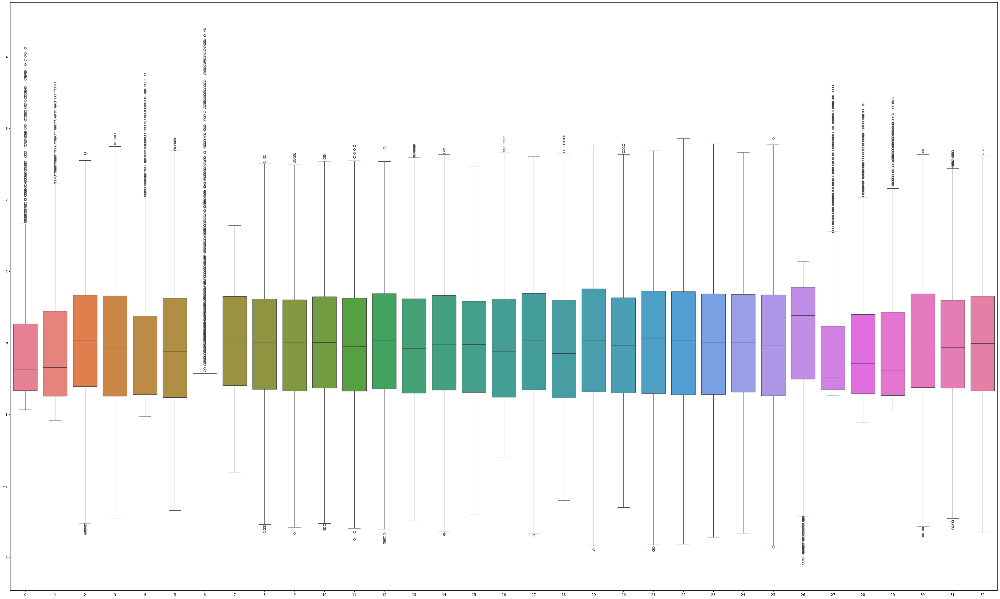

In [ ]:
df_train_normalized = scaler.fit_transform(df_train)

fig = plt.figure(figsize=(50, 30))
ax = sns.boxplot(data=df_train_normalized, orient="v")
print(">> Se visualizan los datos en conjunto: ")
plt.show()

>> Se visualizan el deathrate sin los datos atípicos: 


<Figure size 5000x3000 with 0 Axes>

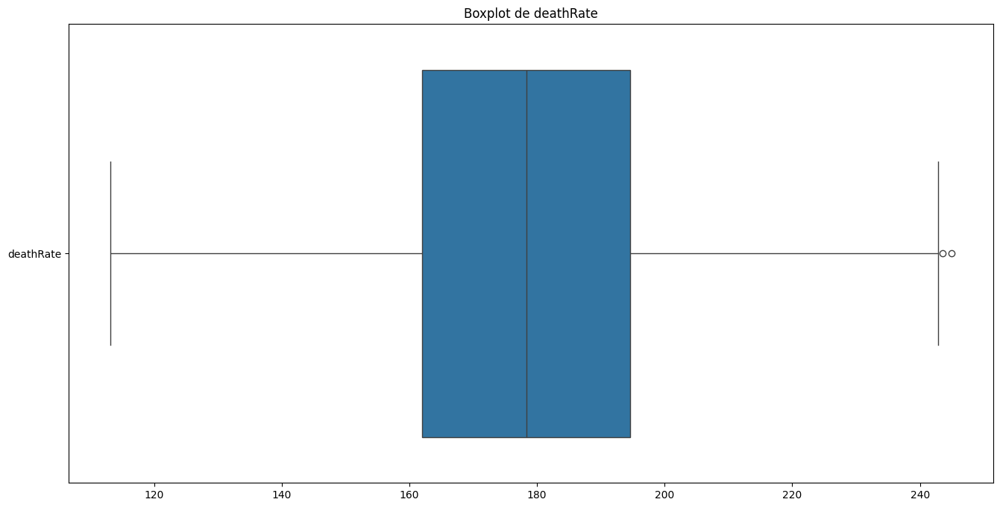

In [ ]:
fig = plt.figure(figsize=(50, 30))
plt.figure(figsize=(16, 8))
plt.title('Boxplot de deathRate')
ax = sns.boxplot(data=df_train[['deathRate']], orient="h")
print(">> Se visualizan el deathrate sin los datos atípicos: ")
plt.show()

Se puede observar una mejor distribución de los datos, ya que, en una misma escala estos no tienen valores excseivamente lejanos a la concentración de los datos.

<i><h5>Completitud</h5></i>

como se menciona el la parte superior del informe, por la cantidad de daos faltantes, siendo un porcentaje significativo, se considera que se debene eliminar, pues, estos si se completan pueden alterar los resultados al tener tantos datos no representativos. Por esto se eliminan las columnas 'PctSomeCol18_24' y 'PctPrivateCoverageAlone'.

In [ ]:
df_train = df_train.drop(['PctSomeCol18_24', 'PctPrivateCoverageAlone'], axis=1)

In [ ]:
print(">> Se observan los nuevos porcenajes de datos nulos: ")
(df_train.isnull().sum()/df_dim[0]*100).sort_values(ascending=False)

>> Se observan los nuevos porcenajes de datos nulos: 


studyPerCap               17.166979
avgAnnCount               15.619137
popEst2015                13.461538
PctBlack                  12.382739
avgDeathsPerYear          12.242026
PctAsian                  10.694184
PctOtherRace               9.849906
binnedInc                  9.615385
PctEmployed16_Over         6.238274
AvgHouseholdSize           6.050657
PctWhite                   5.909944
BirthRate                  5.487805
medIncome                  4.033771
PctMarriedHouseholds       3.236398
incidenceRate              3.189493
PctBachDeg18_24            2.861163
MedianAge                  2.861163
MedianAgeMale              2.579737
povertyPercent             2.532833
PctBachDeg25_Over          2.485929
deathRate                  2.345216
PctNoHS18_24               2.204503
PercentMarried             2.204503
PctUnemployed16_Over       2.063790
MedianAgeFemale            2.016886
PctHS18_24                 1.547842
PctPublicCoverageAlone     1.219512
PctHS25_Over               1

Viendo los nuevos porcentajes de datos nulos, se considera que hay un alto número de datos faltantes, aunque hay columna que aportan al análisis, se considera que reemplazarlos por la media al ser un número considerable por la cantidad de datos puede perjudicar los resultados, por lo tanto aquellas columnas con alto número de datos faltantes se decide eliminarlas, en este caso se escoge el porcentaje del 10% de los datos teniendo en cuenta a la equivalencia y significancia de esta magnitud sobre el total de os datos en este punto.


In [ ]:
df_train = df_train.drop(['studyPerCap', 'avgAnnCount', 'popEst2015', 'PctBlack', 'avgDeathsPerYear', 'PctAsian'], axis=1)

Igualmente,se observa que los datos faltantes pueden obstaculizar en desarrollo de la relación, por lo que se decide que aquellos datos (NO columnas) con porcentajes menores al 2.2% se elimina la fila a la que pertenece para observar las nuevas medidas de tendencia central teniendo en cuenta la cantidad de datos y la significancia del porcentaje de los datos a eliminar sobre el total. Se sabe que disminuirá los porcentajes de datos faltantes y por lo tanto hace de mayor tratabilidad los datos.

In [ ]:
missing_percent = df_train.isnull().sum()/df_dim[0]*100
data_to_erase = missing_percent[missing_percent < 2.2].index
df_train = df_train.dropna(subset=data_to_erase)
print(">> Los nuevos porcentajes de datos nulos son:")
(df_train.isnull().sum()/df_dim[0]*100).sort_values(ascending=False)

>> Los nuevos porcentajes de datos nulos son:


PctOtherRace              8.818011
binnedInc                 8.442777
PctEmployed16_Over        5.393996
AvgHouseholdSize          4.737336
BirthRate                 4.690432
PctWhite                  3.893058
medIncome                 3.189493
incidenceRate             2.439024
PctBachDeg18_24           2.251407
PctMarriedHouseholds      2.016886
PctNoHS18_24              1.782364
deathRate                 1.500938
PctBachDeg25_Over         1.407129
MedianAge                 1.078799
MedianAgeMale             0.938086
PercentMarried            0.844278
povertyPercent            0.797373
PctHS18_24                0.000000
PctUnemployed16_Over      0.000000
PctPrivateCoverage        0.000000
PctEmpPrivCoverage        0.000000
PctPublicCoverage         0.000000
PctPublicCoverageAlone    0.000000
MedianAgeFemale           0.000000
PctHS25_Over              0.000000
dtype: float64

Los de datos nulos menores o cercanos al 10% se reemplazan por su media ya que son datos numéricos teniendo en cuenta lo mencionado en el apartado superior, pues se puede imputar ya que las medidas son significativas y los porcentajes de datos son muy elevados para eliminar todos los datos con valores nulos y no es posible quitar la columna ya que su significado aporta al análisis de manera significativa.

In [ ]:
df_train = df_train.fillna(df_train.mean())
print(">> Se observa que todos los porcentajes de valores nulos son 0%: ")
(df_train.isnull().sum()/df_dim[0]*100).sort_values(ascending=False)

>> Se observa que todos los porcentajes de valores nulos son 0%: 


incidenceRate             0.0
PctBachDeg25_Over         0.0
BirthRate                 0.0
PctMarriedHouseholds      0.0
PctOtherRace              0.0
PctWhite                  0.0
PctPublicCoverageAlone    0.0
PctPublicCoverage         0.0
PctEmpPrivCoverage        0.0
PctPrivateCoverage        0.0
PctUnemployed16_Over      0.0
PctEmployed16_Over        0.0
PctHS25_Over              0.0
medIncome                 0.0
PctBachDeg18_24           0.0
PctHS18_24                0.0
PctNoHS18_24              0.0
PercentMarried            0.0
AvgHouseholdSize          0.0
MedianAgeFemale           0.0
MedianAgeMale             0.0
MedianAge                 0.0
binnedInc                 0.0
povertyPercent            0.0
deathRate                 0.0
dtype: float64

Ahora bien, se verifica si dos columnas son idénticas ya que los datos fueron reemplazados.

In [ ]:
print(">> Se observa que hay valores duplicados, hay {} datos los duplicados hay {} datos duplicados".format(
    df_train.shape[0], df_train.duplicated().sum()))

>> Se observa que hay valores duplicados, hay 1973 datos los duplicados hay 0 datos duplicados


Por último se actualiza la columna features para la partición de datos.

<strong><h4>3. Modelado (Camilo Mercado)</h4></strong>

<h5>Escogencia de variables para el modelo</h5>

Para escoger las variables del modelo se vuele a analizar la correlación con los datos previamente limpiados.

In [ ]:
features = df_train.drop(['deathRate', 'PctMarriedHouseholds', 'PctEmpPrivCoverage', 'PctPublicCoverageAlone'], axis=1).columns.values

>> Se visualizan los datos comparados con la variable objetivo: 


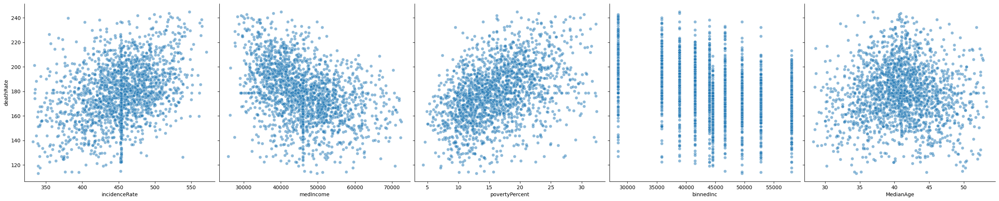

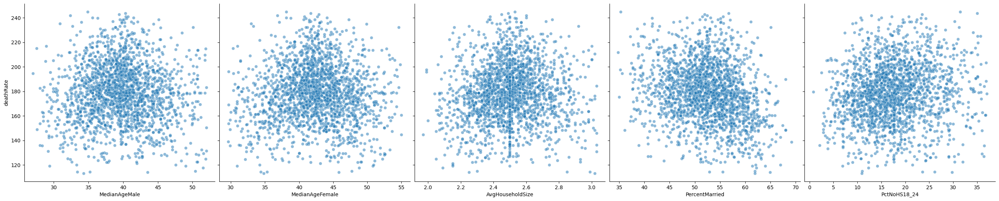

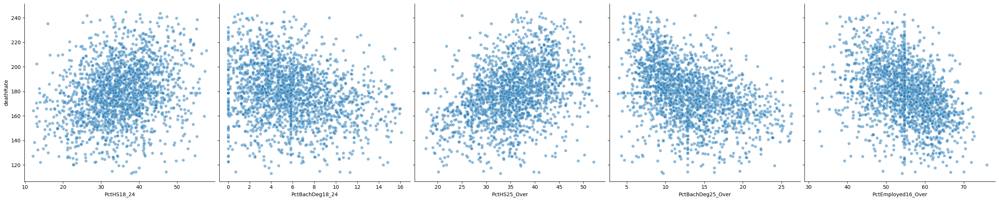

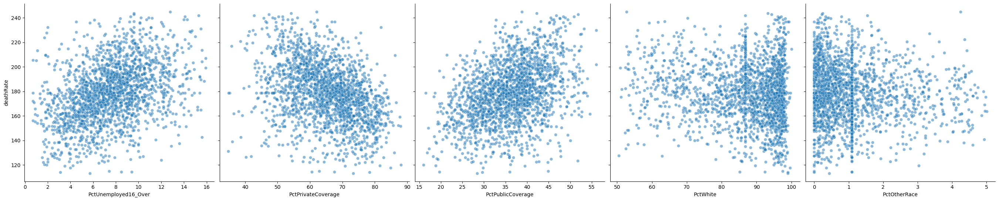

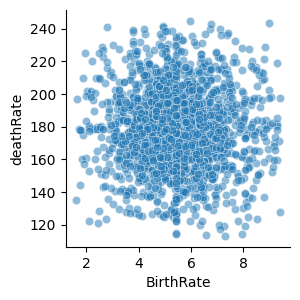

In [ ]:
print(">> Se visualizan los datos comparados con la variable objetivo: ")
sns.pairplot(df_train, height=5.5, y_vars=target,
             x_vars=features[:5], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=5.5, y_vars=target,
             x_vars=features[5:10], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=5.5, y_vars=target,
             x_vars=features[10:15], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=5.5, y_vars=target,
             x_vars=features[15:20], kind="scatter", plot_kws={"alpha": 0.5})
sns.pairplot(df_train, height=3, y_vars=target,
             x_vars=features[20:], kind="scatter", plot_kws={"alpha": 0.5})

En este punto se escogen las variables que muestran relaciones lineales con la variable de interés  por medio de un análisis cualitativo para observar el coportamiento del modelo con diferentes combinaciones de variables, inicialmente se eligen:
<ul>
  <li>incidenceRate</li>
  <li>medIncome</li>
  <li>povertyPercent</li>
  <li>binnedInc</li>
  <li>PctBachDeg25_Over</li>
  <li>PctPublicCoverage</li>
  <li>PctUnemployed16_Over</li>
  <li>PercentMarried</li>
  <li>PctEmployed16_Over</li>
</ul>

Por esto se observa nuevamente la colinealidad entre estas variables.

Es importante mencionar que las líneas observadas en las gráficas corresponden a los valores reemplazado en la media que se concentran en ese punto, por lo que se tiene especial cuidado al momento de escoger estos valores para la construcción del modelo.


<Axes: >

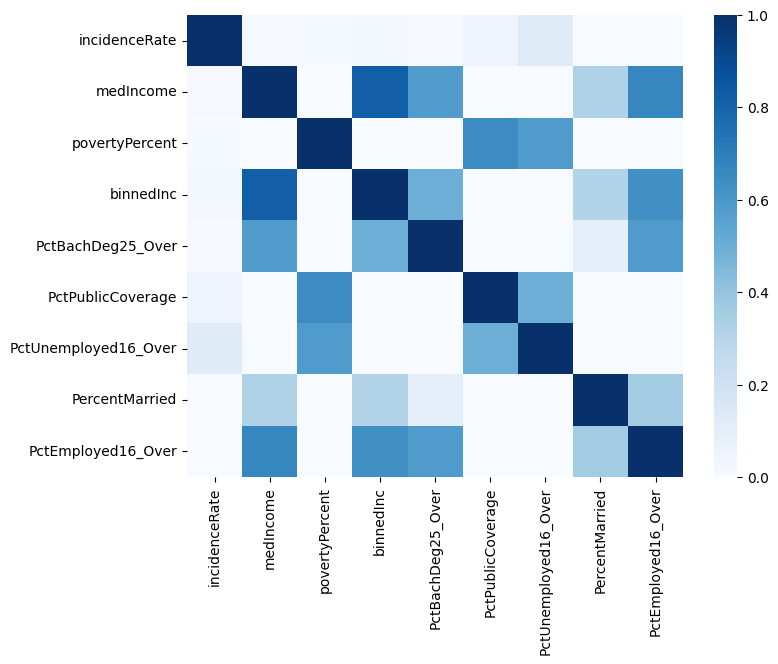

In [ ]:
features = ['incidenceRate', 'medIncome', 'povertyPercent', 'binnedInc', 'PctBachDeg25_Over', 'PctPublicCoverage', 'PctUnemployed16_Over', 'PercentMarried', 'PctEmployed16_Over']

plt.figure(figsize=(8, 6))
sns.heatmap(df_train[features].corr(), cmap="Blues", vmin=0, vmax=1)

Se observa que las colinealidades se encuentran por debajo de 0.8, por lo que se considera que son columnas apropiadas para el análisis en esta ocsaión. La decisión dle porcentaje máximo aceptado se basa en recomendaciones de otros informes vistos en el curso.

Se hace un primer modelo de regresión lineal para observar la relación de las variables

In [ ]:
regression = LinearRegression()
x_train, x_validate, y_train, y_validate = train_test_split(df_train[features], df_train[target], test_size=0.2, random_state=777)

regression.fit(x_train, y_train)

LinearRegression()

In [ ]:
pd.DataFrame({"columns": features, "coef": regression.coef_[0]})

,columns,coef
0,incidenceRate,0.193761
1,medIncome,-0.000092
2,povertyPercent,0.367716
3,binnedInc,-0.000284
4,PctBachDeg25_Over,-1.318169
5,PctPublicCoverage,0.039240
6,PctUnemployed16_Over,0.869323
7,PercentMarried,-0.038935
8,PctEmployed16_Over,-0.071277


En este punto se puede observar que hay variables que pesan más sobre el modelo que otras, como lo son 'PovertyPercent', 'PctHS25_Over' y 'PctUnemployed16_Over', a las cuales se le presta especial atención para la construcción del modelo.

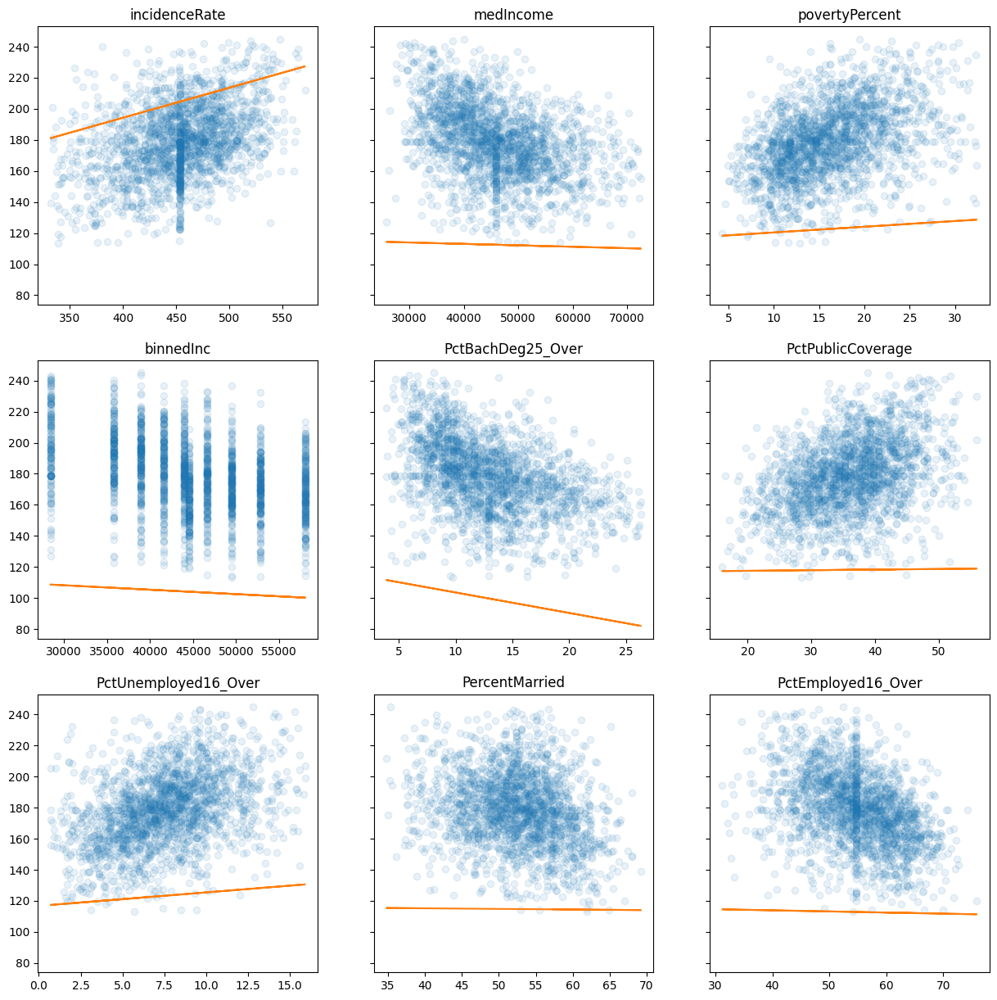

In [ ]:
f, axs = plt.subplots(3, 3, sharey=True, figsize=(15, 15))

for i in range(len(features)):
    col = features[i]
    X_t = df_train[features]
    x = X_t[col]
    m = regression.coef_[0][i]
    b = regression.intercept_[0]

    axs[i//3, i%3].plot(x, df_train[target], "o", alpha=0.1)
    axs[i//3, i%3].plot(x, x * (m) + (b))
    axs[i//3, i%3].set_title(col)

Se observa de antemano que existen relaciones de la tendencia que no se alinea con la tendencia de los datos, por lo que se decide seguir observando el comportamiento con otras variables, pero se sigue evaluando el modelo actual a manera de análisis.

Con la intención de validar este primer modelo, se encuentran las medidas de validación correspondientes para tener un punto de comparación respecto a otros modelos y poder interpretar este valor.

Se decido hacer 2 subsets, uno de validación y uno de entrenamiento antes de usarlo con test para ver su comportamiento con diferentes cantidades de datos.

In [ ]:
features = ['incidenceRate', 'medIncome', 'povertyPercent', 'binnedInc', 'PctBachDeg25_Over',
            'PctPublicCoverage', 'PctUnemployed16_Over', 'PercentMarried', 'PctEmployed16_Over']

x_train, x_validate, y_train, y_validate = train_test_split(df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:", mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt( mean_squared_error(y_train, regression.predict(x_train))))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt( mean_squared_error(y_validate, regression.predict(x_validate))))

>> MAE con datos de entrenamiento: 14.374611348738544
>> RMSE con datos de entrenamiento: 18.676186129364712
------------------------------------------------------------
>> MAE con datos de entrenamiento: 14.060398617844662
>> RMSE con datos de entrenamiento: 17.980417910220844


Como se observa en este análisis inicial, las variables tienen una correlación adecuada, pues el error es menor a la varianza obtenida para los valores de respuesta los cuales se muestran a continuación:

In [ ]:
y_train.describe()

,deathRate
count,1578.000000
mean,178.800953
std,23.487081
min,113.200000
25%,163.100000
50%,178.684750
75%,194.300000
max,244.900000


In [ ]:
pct_error = mean_absolute_error(y_train, regression.predict(x_train))/y_train.mean()*100
print(f">> Igualmente, al obtener una media del {float(y_train.mean())} el error equivale a {float(pct_error)}%")

>> Igualmente, al obtener una media del 178.80095279046185 el error equivale a 8.039448965120592%


Teniendo esto en cuenta, con errores cercanos al 10% se considera una buena primera aproximación. Por esto mismo, se realizan pruebas y ajustes para obtener un resultado óptimo, por lo tanto repitiendo e iterando entre los mejores resultados observando la relación lineal de las variables con el modelo, se obtienen diferentes resultados, los cuales disminuyen gradualmente las medidas de error.

<strong><h4>4. Evaluación cuantitativa</h4></strong>

A manera de validación cuantitativa de la mejora del modelo se toma la medida de los errores en el conjunto de prueba, buscando las mejores combinaciones por medio del procedimiento realizado en la parte superior (revisar colinealidad, revisar apariencia lineal respecto a la variable de interés, luar comportamiento respecto al modelo, su influencia y dirección, para lograr entrenar al modelo y que este produzca las medidas de error)

<span style="color: red;">Por comodidad visual y orden del cuaderno presentado no se presenta el procedimiento iterativo. En caso de querer ver resultados detallados, configurar la variable 'features' en la sección anterior para mostrar sus medidas.</span>

Para esto, se inicia, presentando la mejor combinación obtenida con 4 variables:

In [ ]:
features = ['incidenceRate', 'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']
x_train, x_validate, y_train, y_validate = train_test_split(df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, regression.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_train, y_train))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(
    y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_validate, regression.predict(x_validate))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_validate, y_validate))

>> MAE con datos de entrenamiento: 14.193906093443884
>> RMSE con datos de entrenamiento: 18.647948165491538
>> R cuadrado con datos de entrenamiento: 0.3692179458538031
------------------------------------------------------------
>> MAE con datos de entrenamiento: 13.952587774583275
>> RMSE con datos de entrenamiento: 18.033146521494754
>> R cuadrado con datos de entrenamiento: 0.4539539452238298


Observando una disminución en el error, demostrando la hipótesis de las variables utilizadas se presenta la mejor combinación con 5 variables realizando el proceso de forma iterativa:

In [ ]:
features = ['incidenceRate', 'MedianAgeFemale', 'PctHS25_Over',
            'PctUnemployed16_Over', 'PctPrivateCoverage']
x_train, x_validate, y_train, y_validate = train_test_split(
    df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, regression.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_train, y_train))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(
    y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_validate, regression.predict(x_validate))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_validate, y_validate))

>> MAE con datos de entrenamiento: 14.13138354977124
>> RMSE con datos de entrenamiento: 18.627470577576098
>> R cuadrado con datos de entrenamiento: 0.3706025274429313
------------------------------------------------------------
>> MAE con datos de entrenamiento: 13.844396579254335
>> RMSE con datos de entrenamiento: 17.93868949904779
>> R cuadrado con datos de entrenamiento: 0.4596593059349001


Observando una disminución en el error, demostrando la hipótesis de las variables utilizadas se presenta la mejor combinación con 6 variables:

In [ ]:
features = ['incidenceRate', 'binnedInc', 'MedianAgeFemale',
            'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']
x_train, x_validate, y_train, y_validate = train_test_split(
    df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, regression.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_train, y_train))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(
    y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_validate, regression.predict(x_validate))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_validate, y_validate))

>> MAE con datos de entrenamiento: 14.018550940611549
>> RMSE con datos de entrenamiento: 18.47824351177055
>> R cuadrado con datos de entrenamiento: 0.38064650227976493
------------------------------------------------------------
>> MAE con datos de entrenamiento: 13.85253560459753
>> RMSE con datos de entrenamiento: 17.951778540698562
>> R cuadrado con datos de entrenamiento: 0.4588704944550166


Observando una disminución en el error, demostrando la hipótesis de las variables utilizadas se presenta la mejor combinación con 7 variables:

In [ ]:
features = ['incidenceRate', 'binnedInc', 'MedianAgeFemale', 'PctHS18_24',
            'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']
x_train, x_validate, y_train, y_validate = train_test_split(
    df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, regression.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_train, y_train))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(
    y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_validate, regression.predict(x_validate))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_validate, y_validate))

>> MAE con datos de entrenamiento: 13.986873347480776
>> RMSE con datos de entrenamiento: 18.414671900175914
>> R cuadrado con datos de entrenamiento: 0.3849007563185586
------------------------------------------------------------
>> MAE con datos de entrenamiento: 13.746280470661713
>> RMSE con datos de entrenamiento: 17.753561806220176
>> R cuadrado con datos de entrenamiento: 0.47075441515353944


Al final, observando la tendencia se decide combinar estas variables con la última que demuestra correlación con la variable de interés 'povertyPercent', por lo que buscan las medidas de error:

In [ ]:
features = ['incidenceRate', 'povertyPercent', 'binnedInc', 'MedianAgeFemale',
            'PctHS18_24', 'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']
x_train, x_validate, y_train, y_validate = train_test_split(
    df_train[features], df_train[target], test_size=0.2, random_state=777)
regression = LinearRegression()
regression.fit(x_train, y_train)

print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, regression.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, regression.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_train, y_train))
print("-"*60)
print(">> MAE con datos de entrenamiento:", mean_absolute_error(
    y_validate, regression.predict(x_validate)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_validate, regression.predict(x_validate))))
print(">> R cuadrado con datos de entrenamiento:",
      regression.score(x_validate, y_validate))

>> MAE con datos de entrenamiento: 13.953907705677745
>> RMSE con datos de entrenamiento: 18.375393240859008
>> R cuadrado con datos de entrenamiento: 0.3875219821248026
------------------------------------------------------------
>> MAE con datos de entrenamiento: 13.746464299940211
>> RMSE con datos de entrenamiento: 17.740767920975657
>> R cuadrado con datos de entrenamiento: 0.4715169289065678


Se logra pasar de un MAE de 14,19 a 13,95 con un mismo número de variables pero eligiendo aquellas que demuestran mejor relación con la variable independiente. 

Siendo más especificos con la intepretación de las medidas de error ya que se llega a un modleo mejorado, teniendo en cuenta que el MAE (error medio absoluto) es una medida de error que calcula el promedio de las diferencias absolutas entre los valores predichos y los valores reales. Cuanto menor sea el valor del MAE, mejor será el modelo, ya que indica que las predicciones están más cerca de los valores reales, en este caso, comparado con la magnitud de las variables con las que se trabaja el error MAE corresponde al 7,80% respecto a la media, que, siendo menor al 10%.

Siendo este valor menor al 10% se considera un buen resultado en este contexto, ya que indica que el error promedio de las predicciones del modelo es menos del 10% del valor real, en promedio, las predicciones del modelo se desvían en un 10% del valor real. Por lo tanto, se indica que las predicciones del modelo son relativamente precisas y cercanas a los valores reales.

Respecto al valor de R2, se indica que este varía entre 0 y 1 y mide cuánta de la variabilidad total de los datos puede ser explicada por el modelo. En este caso, siendo de 0.472 significa que el modelo puede explicar el 47.2% de la variabilidad en los datos.

Aunque un R2 de 0.472 puede parecer bajo, la interpretación de este valor depende del contexto, y, en este caso, como se trabajan con datos poblacionales sociales la literatura de datos en ciencias sociales, indica que un R2 de 0.472 puede ser un buen resultado.


A continuación se muestran a detalle los coeficientes de las variables de esta iteración los cuales resultan de interés antes de presentar conclusiones cuantitativas

In [ ]:
pd.DataFrame({"columns": features, "coef": regression.coef_[0]}).sort_values(by="coef", ascending=False)

,columns,coef
6,PctUnemployed16_Over,0.988625
5,PctHS25_Over,0.792277
1,povertyPercent,0.445541
4,PctHS18_24,0.239128
0,incidenceRate,0.185115
2,binnedInc,-0.000352
7,PctPrivateCoverage,-0.249175
3,MedianAgeFemale,-0.293900


Se observa que la variable de mayor influencia en el modelo es 'PctUnemployed16_Over' seguida de 'PctHS25_Over', 'povertyPercent', 'MedianAgeFemale', 'PctPrivateCoverage', 'PctHS18_24', 'incidenceRate' y 'binnedInc' en ese mismo orden.

Igualmente, se considera relevante observar las diferencias con las medidas de tendencia central reales:

In [ ]:
abs(y_train - regression.predict(x_train)).describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

,deathRate
count,1578.000000
mean,13.953908
std,11.959690
min,0.027796
25%,4.917284
50%,11.181923
75%,19.388623
95%,38.252150
99%,54.252539
max,87.464952


Entonces, habiendo observado el modelo, equipo recomienda utlizar en producción el modelo de estimación del número de muertes por cáncer por cada 100.000 habitantes, debido a que, como se discutió, las medidas de error indican tener una buena capacidad de predicción sobre los datos, por esto, no es necesario hacer estimaciones de forma manual, pues el modelo presenta resultado apropiados.

Se puede observar que no existen problemas de sobre-estimación y que el modelo tiene valores de error cercanos, incluso menores, a 10 que cubre casi el 50% de los datos, pero, se observa que para datos por encima del 75% de los datos de deathRate el modelo se comineza a desviar significativamente, por lo que recomienda evaluar estos valores manualmente con datos encima de los valores correspondientes al tercer cuartil de los datos presentados para este informe (valores de deathRate correspondientes a 190 o superior aproximadamente).

<strong><h4>5. Evaluación cualitativa</h4></strong>

Se considera de relevancia hacer un análisis cualitativo por medio de la observación de gráficas en diferentes contexos, en especial observar  cómo se comportan las variables en relación a la variable de interés y verificar la colinealidad entre variables del modelo.

>> Se visualizan los datos comparados con la variable objetivo: 


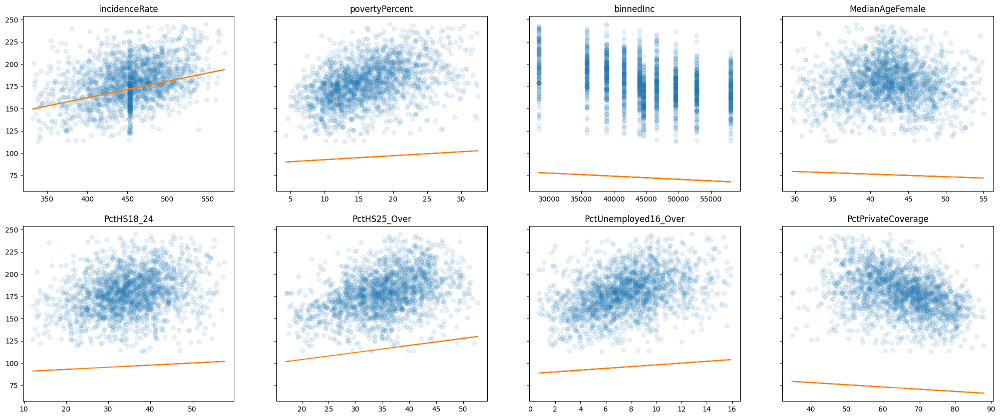

In [ ]:
print(">> Se visualizan los datos comparados con la variable objetivo: ")

f, axs = plt.subplots(2, 4, sharey=True, figsize=(25, 10))

for i in range(len(features)):
    col = features[i]
    X_t = df_train[features]
    x = X_t[col]
    m = regression.coef_[0][i]
    b = regression.intercept_[0]

    axs[i//4, i % 4].plot(x, df_train[target], "o", alpha=0.1)
    axs[i//4, i % 4].plot(x, x * (m) + (b))
    axs[i//4, i % 4].set_title(col)

Se evidencia que las lineas de tendencia corresponden en pendiente a la dirección de los datos a lo largo del progreso de la variable, lo cuál indica que las variables son coherentes con la variable objetivo.

>> Se visualizan los datos para revisar su colinealidad: 


<function matplotlib.pyplot.show(close=None, block=None)>

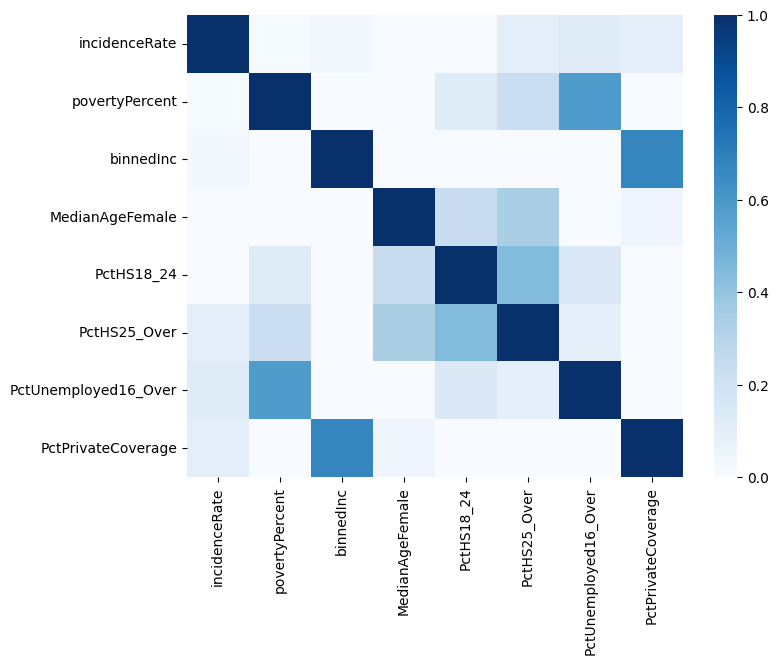

In [ ]:
print(">> Se visualizan los datos para revisar su colinealidad: ")
plt.figure(figsize=(8, 6))
sns.heatmap(df_train[features].corr(), cmap="Blues", vmin=0, vmax=1)
plt.show

Se observa que la colinealidad entre variables es baja y por lo tanto se considera una combinación aceptable de variables.

Por medio de las gráficas presentadas se puede evaluar que las variables escogidas para entrenar el modelo son apropiadas. Esto se especifica a detalle en las siguientes secciones:

<strong><h4>5.1. Validación de supuestos (David Leon)</h4></strong>

En esta sección estamos evaluando si el modelo de regresión que hemos creado cumple con ciertas suposiciones fundamentales que son necesarias para que los resultados de la regresión sean válidos y confiables. Estas suposiciones incluyen la linealidad, la normalidad de los residuos, la homocedasticidad y la independencia de los errores.

Empezaremos con linealidad, la cual implica que la relación entre las variables independientes y la variable dependiente es lineal. En la exploración de este supuesto, trazamos los valores ajustados por el modelo versus los residuos. Si la relación es lineal, esperamos ver una dispersión aleatoria de puntos alrededor de cero en el gráfico de residuos versus ajustes.

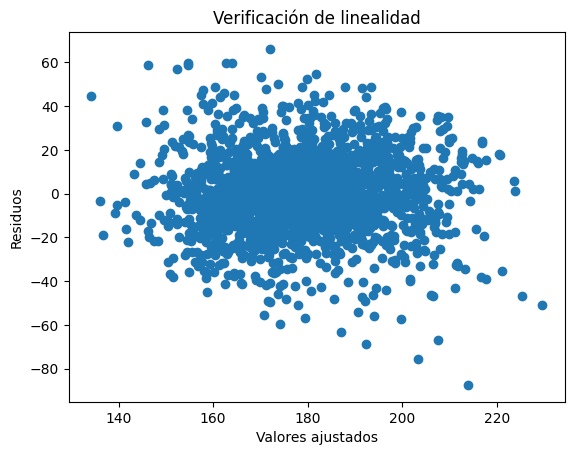

In [ ]:
valores_ajustados = regression.predict(df_train[features])

residuos = df_train[target] - valores_ajustados

plt.scatter(valores_ajustados, residuos)
plt.xlabel('Valores ajustados')
plt.ylabel('Residuos')
plt.title('Verificación de linealidad')
plt.show()

Esto indicaría que la relación entre las variables independientes y la variable dependiente es lineal. 

Posteriormente seguimos con la normalidad de los residuos. Este supuesto asume que los residuos siguen una distribución normal. Verificamos esto con el test de Shapiro-Wilk.

In [ ]:
shapiro_test = stats.shapiro(residuos)
print("Estadística de Shapiro-Wilk:", shapiro_test.statistic)
print("Valor p:", shapiro_test.pvalue)

Estadística de Shapiro-Wilk: 0.9923532683742179
Valor p: 1.2417686429094409e-08


Dado que el valor p es mucho menor que el nivel de significancia comúnmente utilizado de 0.05 (es prácticamente cero), se sugiere que hay evidencia suficiente para rechazar la hipótesis nula de que los residuos siguen una distribución normal. En otras palabras, los residuos no siguen una distribución normal según este test. Esto significa que hay diferencias significativas entre las medidas.

Seguimos con homocedasticidad, este supuesto implica que la varianza de los residuos es constante en todos los niveles de las variables predictoras. Lo evaluamos trazando los residuos versus los valores ajustados. Si la varianza de los residuos es constante, esperamos ver una dispersión uniforme alrededor de cero en el gráfico de residuos versus ajustes.

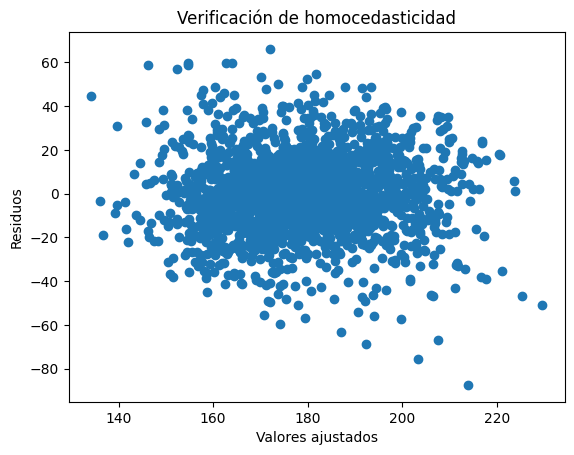

In [ ]:
plt.scatter(valores_ajustados, residuos)
plt.xlabel('Valores ajustados')
plt.ylabel('Residuos')
plt.title('Verificación de homocedasticidad')
plt.show()

Ya que los residuos tienen una dispersión constante alrededor de cero a lo largo de los valores ajustados, esto sugiere que se cumple el supuesto de homocedasticidad. Además, no hay un patrón claro en la dispersión de los residuos

Finalmente, revisamos la independencia de los errores, aquí suponemos que los errores no están correlacionados entre sí. Lo evaluamos utilizando el test de Durbin-Watson. Un valor cercano a 2 en el test de Durbin-Watson sugiere independencia de los errores.

In [ ]:
dw_test = durbin_watson(residuos)
print("Valor del test de Durbin-Watson:", dw_test)

Valor del test de Durbin-Watson: [1.95329815]


Dado que el valor que se obtuvo está cerca de 2, sugiere que no hay autocorrelación serial significativa en los residuos, lo que es consistente con la independencia de los errores. Esto es una buena señal para la validez del modelo de regresión.

Referencias: 
* https://rstudio-pubs-static.s3.amazonaws.com/740953_5b6d2acfe47b43b99a7d898d13ff9aec.html
* https://www.investopedia.com/terms/d/durbin-watson-statistic.asp
* https://bookdown.org/dietrichson/metodos-cuantitativos/test-de-normalidad.html

<strong><h4>5.2. Transformaciones complementarias e interpretación de los coeficientes (David Leon)</h4></strong>

Empezaremos con las transformaciones complementarias, en este ejercicio en particular, solo la normalidad de los residuos nos arrojó un valor no esperado. Ya que idealmente quisieramos ver una distribución normal para el test de Shapiro-Wilk. Para abordar esta transformación, realizamos un histograma que nos permite ver hacia que lado se ve sesgada la distribución. 

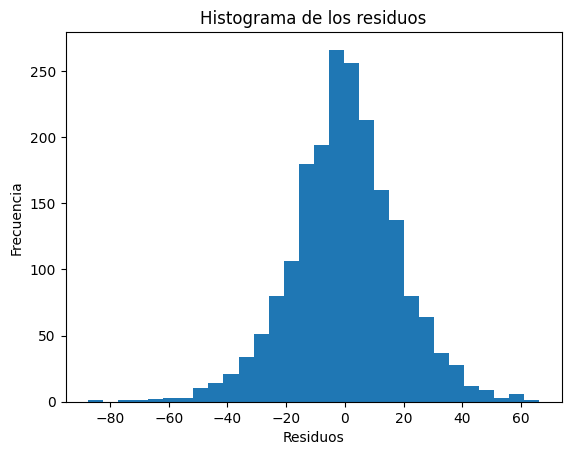

In [ ]:
plt.hist(residuos, bins=30)
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.title('Histograma de los residuos')
plt.show()

Al identificar que la distribución está sesgada hacia la derecha, estudiamos la aplicación de una transformación logarítmica y la de un modelo de minimos cuadrados. Sin embargo, teniendo en cuenta la naturaleza de nuestros datos, nos decidimos por aplicar un modelo de regresión robusto.

In [ ]:
modelo_robusto = sm.RLM(df_train[target], sm.add_constant(df_train[features]), M=sm.robust.norms.TukeyBiweight())
resultado_robusto = modelo_robusto.fit()

Con este modelo, estamos empleando una técnica que asigna pesos diferentes a las observaciones según su distancia a la mediana, lo que ayuda a reducir el impacto de los valores atípicos en la estimación de los coeficientes. Esto proporciona una buena alternativa, especialmente cuando se presentan problemas como no normalidad en los errores.

Una vez creado el modelo, verificamos los supuestos de la regresión una vez más.

Empezamos verificando de nuevo la linealidad.

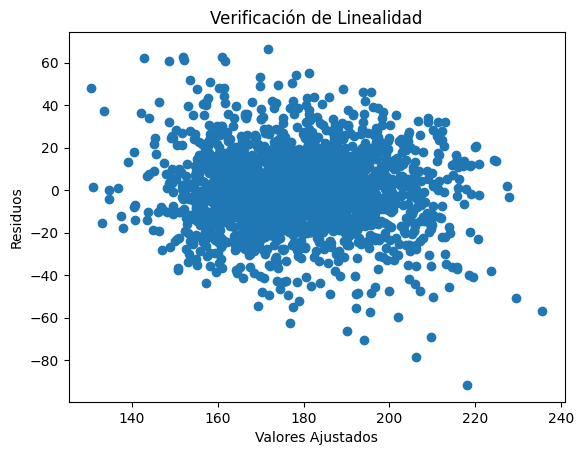

In [ ]:
residuos = resultado_robusto.resid
valores_ajustados = resultado_robusto.fittedvalues
plt.scatter(valores_ajustados, residuos)
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.title('Verificación de Linealidad')
plt.show()

Obtenenemos que la relación entre las variables independientes y la variable dependiente es lineal.

Volvemos a verificar la independencia de los residuos. 

In [ ]:
estadistica_dw = sm.stats.stattools.durbin_watson(residuos)
print("Estadística de Durbin-Watson:", estadistica_dw)

Estadística de Durbin-Watson: 1.9584274570418718


De nuevo, ya que el valor que se obtuvo está cerca de 2. Sigue siendo una buena señal para la validez del modelo de regresión.

Verificamos la homocedasticidad, de nuevo.

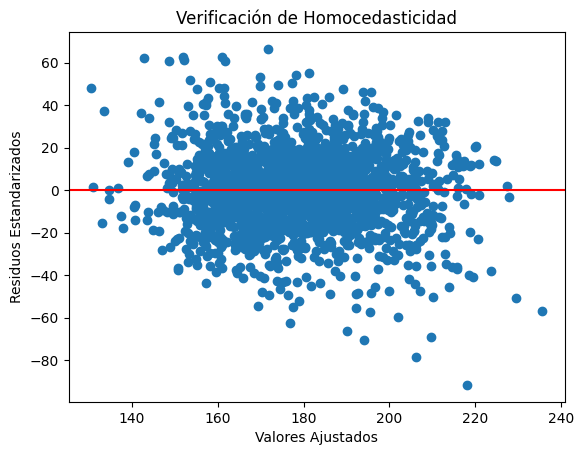

In [ ]:
plt.scatter(valores_ajustados, residuos)
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos Estandarizados')
plt.title('Verificación de Homocedasticidad')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

De nuevo, ya que los residuos tienen una dispersión constante alrededor de cero a lo largo de los valores ajustados, esto sugiere que se cumple el supuesto de homocedasticidad.

Finalmente, verificamos de nuevo la normalidad de los residuos

In [ ]:
shapiro_test = stats.shapiro(residuos)
print("Prueba de Shapiro-Wilk:", shapiro_test)

Prueba de Shapiro-Wilk: ShapiroResult(statistic=0.9894820432790156, pvalue=8.570709087423198e-11)


Teniendo en cuenta que cuanto más cercano esté el valor shapiro_ test a 1, más compatible será la muestra con una distribución normal. En este caso, la estadística de Shapiro-Wilk es cercana a 1, lo que sugiere que los datos podrían ser aproximadamente normales.

Revisamos el histograma de nuevo

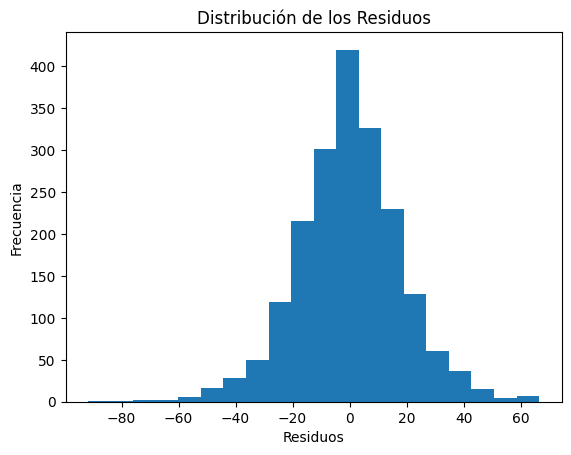

In [ ]:
plt.hist(residuos, bins=20)
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.title('Distribución de los Residuos')
plt.show()

Observamos que la distribución de los residuos mejoró con respecto al primer histograma que realizamos. Lo que confirma que los cambios que se realizaron, tuvieron el resultado esperado.

<h5><b>Interpretación de los coeficientes</b></h5>

Interpretar los coeficientes del modelo de regresión es crucial para comprender cómo cada variable independiente afecta a la variable dependiente. Para esto, tomamos las variables que componen el modelo y realizamos la siguiente interpretación.

In [ ]:
data = pd.DataFrame({"columns": features, "coef_abs": abs(regression.coef_[0])}).sort_values(by="coef_abs", ascending=False)
print(data)

                columns  coef_abs
6  PctUnemployed16_Over  0.988625
5          PctHS25_Over  0.792277
1        povertyPercent  0.445541
3       MedianAgeFemale  0.293900
7    PctPrivateCoverage  0.249175
4            PctHS18_24  0.239128
0         incidenceRate  0.185115
2             binnedInc  0.000352


Para determinar las variables más significativas y menos significativas, generalmente se mira el valor absoluto de los coeficientes.
En este caso, las variables que pesan más sobre el modelo son: 'PctUnemployed16_Over', 'PctHS25_Over', 'povertyPercent' y 'MedianAgeFemale'. Estas variables sugieren que el nivel de desempleo, el nivel educativo, el nivel de pobreza y la edad media de las mujeres en una región tienen un impacto significativo en la variable dependiente del modelo. 

Como se observa, la variable "PctUnemployed16_Over" tiene el mayor coeficiente en valor absoluto, lo que sugiere que el porcentaje de residentes mayores de 16 años desempleados tiene una fuerte influencia en la variable objetivo. Un aumento en este porcentaje probablemente esté asociado con un aumento en las muertes por cáncer. Esto sugiere que el desempleo y la educación secundaria pueden tener un impacto importante en la incidencia de cáncer en los condados.

El comportamiento de las variables "PctHS25_Over" y "PctHS18_24", sugiere que un mayor porcentaje de residentes con educación secundaria completa está asociado con un aumento en la variable objetivo, lo que puede indicar una relación entre la educación y la pobreza en los condados con las muertes por cáncer.

De la misma manera, la variable "MedianAgeFemale", también tiene un coeficiente significativo y positivo. Lo que podría indicar una relación entre la edad y la pobreza en los condados, así como con las muertes por cáncer.

La variable "PctPrivateCoverage" tiene un coeficiente negativo inicialmente, lo que sugiere que un aumento en el porcentaje de residentes con cobertura médica privada está asociado con una disminución en la variable objetivo. Esto indica que la disponibilidad de cobertura médica privada en el condado puede estar relacionada con una reducción de las muertes.

Observando la baja afección de "binnnedInc" se sugiere no incluirla en el modelo final luego de validar los supuestos.

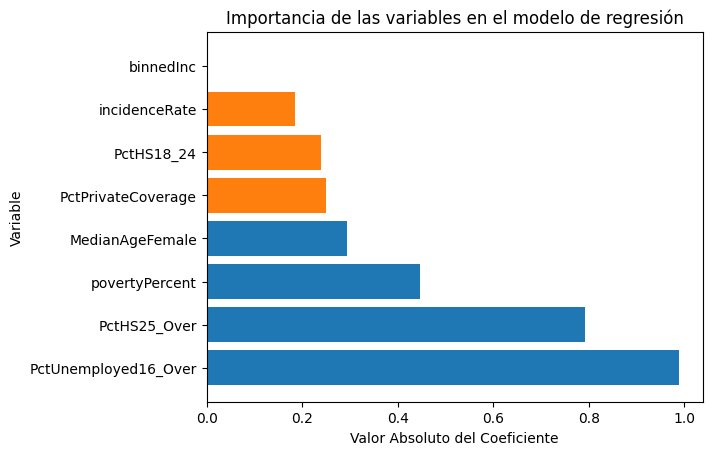

In [ ]:
top_variables = data.head(4)
bottom_variables = data.tail(4)

plt.barh(top_variables["columns"], top_variables["coef_abs"])
plt.barh(bottom_variables["columns"], bottom_variables["coef_abs"])

plt.xlabel('Valor Absoluto del Coeficiente')
plt.ylabel('Variable')
plt.title('Importancia de las variables en el modelo de regresión')
plt.show()

Estos resultados resaltan la interacción entre variables socioeconómicas y de salud en una comunidad. No solo revelan la importancia de factores tradicionales como el nivel de educación y el nivel de pobreza en la salud de una población, sino que también sugieren que características demográficas específicas, como la edad media de las mujeres, pueden desempeñar un papel significativo en los resultados de salud de una región. 

Por otra parte, al considerar las variables menos importantes en el modelo de regresión, es importante tener en cuenta que su impacto relativo puede variar dependiendo del contexto específico del problema y del conjunto de datos utilizado. Aunque estas variables pueden tener coeficientes más pequeños en el modelo actual, podrían desempeñar un papel más significativo en diferentes subpoblaciones o en situaciones específicas. Es por esto que, de observarse cambios significativos en los datos a futuro, se podría sugerir re entrenar el modelo para tener en cuenta posibles variaciones en la importancia relativa de los factores estudiados.

Actualmente, la comprensión de cómo las variables se relacionan con la variable objetivo podría informar políticas públicas y programas de intervención que aborden de manera más efectiva los desafíos de salud en diferentes comunidades.

In [ ]:
features = ['incidenceRate', 'povertyPercent', 'MedianAgeFemale',
            'PctHS18_24', 'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']

x_train = df_train[features]
y_train = df_train[target]
regression.fit(x_train, y_train)
coeficientes = regression.coef_
intercepto = regression.intercept_

ecuacion = f"y_hat = {intercepto[0]:3f}"
for i, coeficiente in enumerate(coeficientes[0]):
    ecuacion += f" + {coeficiente:3f}({features[i]})"

print(">> La ecuación de regresión definitiva es:\n")
print("\t",ecuacion)

>> La ecuación de regresión definitiva es:

	 y_hat = 69.036415 + 0.187252(incidenceRate) + 0.656928(povertyPercent) + -0.263070(MedianAgeFemale) + 0.278550(PctHS18_24) + 0.830103(PctHS25_Over) + 1.067344(PctUnemployed16_Over) + -0.333226(PctPrivateCoverage)


<strong><h4>6. Exportación del mejor modelo (Camilo Mercado)</h4></strong>

Para exportar el mejor modelo se va a simular el proceso realizado a lo largo del informe desde la limpieza de los datos hasta el ajuste del modelo lineal.

Para esto se construyen las funciones que corresponden a los pasos realizados:

Primero se hce la función que transforma los rangos de la columna 'binnedInc' a valores numéricos representantes del rango como se hizo en la preparción de los datos. A continuación se muestra la función:

In [ ]:
def transform_ranges(data: pd.DataFrame):
    try:
        data_temp_max = data['binnedInc'].apply(lambda x: x.split(',')[0])
        data_temp_max = data_temp_max.apply(lambda x: x[1:]).astype(float)
        data_temp_min = data['binnedInc'].apply(lambda x: x.split(',')[1])
        data_temp_min = data_temp_min.apply(lambda x: x[:-1]).astype(float)
        data['binnedInc'] = (data_temp_max + data_temp_min) / 2
    except:
        pass # En un segundo ajuste los datos de binnedInc ya estarán en el formato que se requiere y fallará, por lo que se ignora el error
    return data

Luego se hace una función que elimina los valores atípicos de todo el conjunto de datos teniendo como criterio que los datos no deben estar 1.5 veces fuera del rango intercuartil, decisión que se tomó y argumenetó en la preparación de los datos. Esto se muestra a continuación:

In [ ]:
def remove_outliers(data: pd.DataFrame):
    numeric_data = data.select_dtypes(include=[np.number])
    Q1 = numeric_data.quantile(0.25)
    Q3 = numeric_data.quantile(0.75)
    IQR = Q3 - Q1

    data = data.mask((numeric_data < (Q1 - (1.5 * IQR))) | (numeric_data > (Q3 + (1.5 * IQR))))
    return data

Como fue necesario 2 veces remover datos con diferente número de datos faltantes se hace una función que elimine las columnas con un porcentaje de datos faltantes dado como parámetro para el pipeline:

In [ ]:
def remove_columns_with_missing_data(data: pd.DataFrame, threshold):
    missing_percent = data.isnull().sum() / len(data) * 100
    columns_to_drop = missing_percent[missing_percent > threshold].index
    data = data.drop(columns=columns_to_drop)
    return data

Se hace la preparación de las columnas elegidas, pues, a pesar de la limpieza, las columnas seleccionadas son específicas y elegidas por métricas, por lo que es necesario indicar explícitamente cuales se desea tratar. Igualmente, como se hizo en la preparación de datos se imputaron para lograr una mejor predicción de los datos y no perder valores en el proceso:

In [ ]:

features = ['incidenceRate', 'povertyPercent', 'MedianAgeFemale',
            'PctHS18_24', 'PctHS25_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage']

column_transformer = ColumnTransformer(
    transformers=[
        ('selected_columns', SimpleImputer(strategy="mean"), features)
    ],
    remainder='drop'
)

Teniendo las funciones del preprocesamiento de los datos se realiza un primer pipeline de pre-procesamiento de los datos:

In [ ]:
preproccessor = Pipeline(
    [
        ("transform_binnedInc", FunctionTransformer(transform_ranges, validate=False)),
        ("initial_column_removal", FunctionTransformer(remove_columns_with_missing_data, validate=False, kw_args={"threshold": 20})),
        ("outlier_removal", FunctionTransformer(remove_outliers, validate=False)),
        ("second_column_removal_removal", FunctionTransformer(remove_columns_with_missing_data, validate=False, kw_args={"threshold": 10})),
        ("column_transformer", column_transformer),
    ]
)

Luego se hace 

In [ ]:
pipeline = Pipeline(
    [
        ("preproccessor", preproccessor),
        ("model", LinearRegression())
    ]
)    

In [ ]:
target = 'deathRate'

x_train = df_train_original.drop(target, axis=1)
y_train = df_train_original[target]

pipeline.fit(x_train, y_train)


Pipeline(steps=[('preproccessor',
                 Pipeline(steps=[('transform_binnedInc',
                                  FunctionTransformer(func=<function transform_ranges at 0x0000025CBE0E56C0>)),
                                 ('initial_column_removal',
                                  FunctionTransformer(func=<function remove_columns_with_missing_data at 0x0000025CBE0E6E80>,
                                                      kw_args={'threshold': 20})),
                                 ('outlier_removal',
                                  FunctionTransformer(func=<function remove_out...
                                  FunctionTransformer(func=<function remove_columns_with_missing_data at 0x0000025CBE0E6E80>,
                                                      kw_args={'threshold': 10})),
                                 ('column_transformer',
                                  ColumnTransformer(transformers=[('selected_columns',
                                                                   SimpleImputer(),
                                                                   ['incidenceRate',
                                                                    'povertyPercent',
                                                                    'MedianAgeFemale',
                                                                    'PctHS18_24',
                                                                    'PctHS25_Over',
                                                                    'PctUnemployed16_Over',
                                                                    'PctPrivateCoverage'])]))])),
                ('model', LinearRegression())])

In [ ]:
pipeline_file = "model/model.joblib"

dump(pipeline, pipeline_file)
pipeline_loaded = load(pipeline_file)

In [ ]:
x_train = df_train_original.drop(target, axis=1)
y_train = df_train_original[target]
pipeline_loaded.fit(x_train, y_train)

Pipeline(steps=[('preproccessor',
                 Pipeline(steps=[('transform_binnedInc',
                                  FunctionTransformer(func=<function transform_ranges at 0x0000025CBE0E56C0>)),
                                 ('initial_column_removal',
                                  FunctionTransformer(func=<function remove_columns_with_missing_data at 0x0000025CBE0E6E80>,
                                                      kw_args={'threshold': 20})),
                                 ('outlier_removal',
                                  FunctionTransformer(func=<function remove_out...
                                  FunctionTransformer(func=<function remove_columns_with_missing_data at 0x0000025CBE0E6E80>,
                                                      kw_args={'threshold': 10})),
                                 ('column_transformer',
                                  ColumnTransformer(transformers=[('selected_columns',
                                                                   SimpleImputer(),
                                                                   ['incidenceRate',
                                                                    'povertyPercent',
                                                                    'MedianAgeFemale',
                                                                    'PctHS18_24',
                                                                    'PctHS25_Over',
                                                                    'PctUnemployed16_Over',
                                                                    'PctPrivateCoverage'])]))])),
                ('model', LinearRegression())])

In [ ]:
x_train = df_train_original.drop(target, axis=1)
y_train = df_train_original[target]
print(">> MAE con datos de entrenamiento:",
      mean_absolute_error(y_train, pipeline_loaded.predict(x_train)))
print(">> RMSE con datos de entrenamiento:", np.sqrt(
    mean_squared_error(y_train, pipeline_loaded.predict(x_train))))
print(">> R cuadrado con datos de entrenamiento:",
      pipeline_loaded.score(x_train, y_train))

>> MAE con datos de entrenamiento: 15.11407793239846
>> RMSE con datos de entrenamiento: 20.75817184898424
>> R cuadrado con datos de entrenamiento: 0.4264532589761093


<strong><h4>7. Generación y exportación de datos</h4></strong>

Se usa el pipeline construido para entrenarlo con el set de datos de entrenamiento entero y luego predecir el 'deathRate' emdiante los datos proporcionados por el conjunto de datos de test a estudiar. Los resultados se guardan como un dataframe:

In [ ]:
x_test = df_test

y_test = pipeline_loaded.predict(x_test)

y_test_df = pd.DataFrame(y_test, columns=[target])


Se exportan los resultados de los death rates en formato CSV:

In [ ]:

y_test_df.to_csv('./results/Laboratorio 2 - results.csv', index=False)


Se considera valioso hacer comparaciones acerca de las medidas centrales del conjunto de resultado de test obtenido con la de entrenamiento para entender si se ajustó correctamente a lo esperado:

In [ ]:
y_train_mean = y_train.mean()
y_train_median = y_train.median()
y_train_std = y_train.std()

y_test_mean = y_test_df.mean().iloc[0]
y_test_median = y_test_df.median().iloc[0]
y_test_std = y_test_df.std().iloc[0]

central_measures_diff = pd.DataFrame({
    'Measure': ['Mean', 'Median', 'Standard Deviation'],
    'y_train': [y_train_mean, y_train_median, y_train_std],
    'y_test': [y_test_mean, y_test_median, y_test_std],
    'diff': [abs(y_test_mean-y_train_mean), abs(y_test_median - y_train_median), abs(y_test_std-y_train_std)],
    '% diff': [str((abs(y_test_mean-y_train_mean)/y_train_mean)*100)+'%', str((abs(y_test_median-y_train_median)/y_train_median)*100)+'%', str((abs(y_test_std-y_train_std)/y_train_std)*100)+'%']
})

central_measures_diff

,Measure,y_train,y_test,diff,% diff
0,Mean,179.000047,177.889578,1.110469,0.6203733375781785%
1,Median,178.550000,177.980806,0.569194,0.31878697695600616%
2,Standard Deviation,27.416156,17.478868,9.937288,36.24610326741624%


Al observar que la media y mediana se encuentran en un porcentaje de variación menor al 1% se considera que el funcionamiento del modelo entrenado es el apropiado. Igualmente se observa la disminución de la variación estándar, significando que los datos obtenidos se asemejan más a la recta construída que los propios datos de entrenamiento.

Por último, se considera valioso observar que las tendencias de la recta tenga relación con cada una de las variables en cuanto a su dirección, y estas variables tengan un comportamiento similar a lo estudiado en la construcción del modelo:

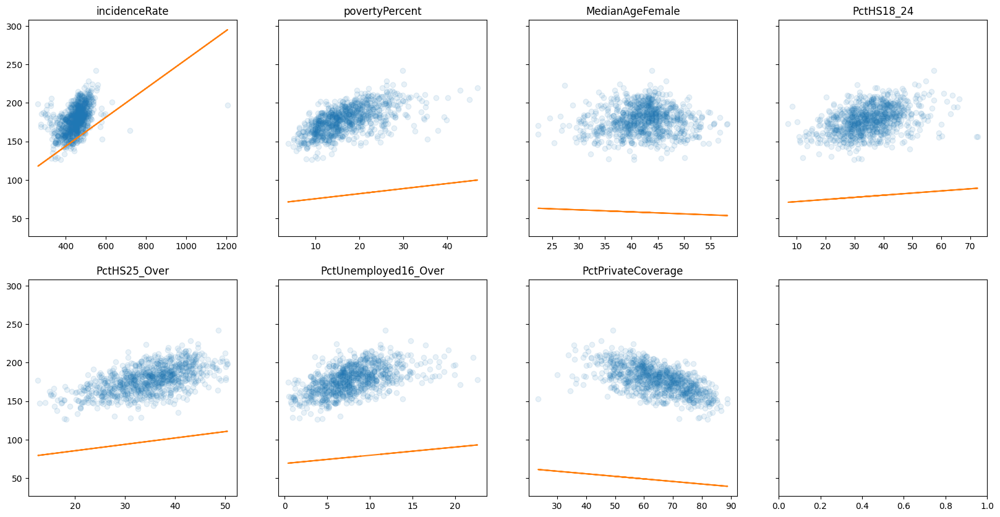

In [ ]:
f, axs = plt.subplots(2, 4, sharey=True, figsize=(20, 10))

for i in range(len(features)):
    col = features[i]
    X_t = x_test
    x = X_t[col]
    m = regression.coef_[0][i]
    b = regression.intercept_[0]

    axs[i//4, i % 4].plot(x, y_test, "o", alpha=0.1)
    axs[i//4, i % 4].plot(x, x * (m) + (b))
    axs[i//4, i % 4].set_title(col)

<strong><h4>8. Visualización de los resultados (Natalia Ortega)</h4></strong>

<h5>Preparación de datos para presentación a la OMS</h5>

Se decide mostrar únicamente a detalle los factores más significativos para la determinar el factor deathRate por comodidad visual. Igualmente, teniendo en cuenta los significados de las variables evaluadas PctHS25_Over y PctHS18_24 se deciden presentar como un solo dato llamado PctHS18_Over.

In [ ]:
x_test['PctHS18_Over'] = x_test['PctHS25_Over'] + x_test['PctHS18_24']
x_test.drop(['PctHS25_Over', 'PctHS18_24'], axis=1, inplace=True)


In [ ]:
x_test

,avgAnnCount,avgDeathsPerYear,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,PctHS18_Over
0,250.0,97,461.8,37782,41516,23.2,0.000000,38888.25,42.6,42.2,...,28.3,46.4,28.7,75.106455,0.616955,0.866157,8.356721,51.013900,4.204317,71.2
1,938.0,334,444.5,72973,224469,5.8,280.662363,93564.75,38.7,37.3,...,64.9,20.8,9.6,89.673330,3.456320,4.511723,0.631605,63.683814,4.708367,57.2
2,29.0,16,372.0,36566,5651,20.9,0.000000,35815.95,42.3,39.8,...,25.8,41.5,22.3,71.920165,0.481762,0.172058,1.531315,49.431818,4.588745,88.0
3,29.0,9,537.2,43523,7121,12.4,0.000000,43962.70,30.7,29.1,...,36.6,30.0,21.8,88.979184,1.254634,0.969490,4.348446,49.512411,9.422492,95.1
4,499.0,215,457.8,40921,79545,20.2,0.000000,41543.55,43.4,41.4,...,33.4,39.3,21.8,89.311026,6.803685,0.592285,1.157993,55.248489,5.769696,82.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
910,60.0,28,457.8,44110,9440,20.8,0.000000,43962.70,39.3,38.1,...,30.6,35.8,18.9,89.473127,2.623783,0.317393,5.765975,55.787641,5.472637,69.9
911,522.0,207,484.3,62198,102382,10.6,419.995702,93564.75,40.1,39.5,...,54.7,30.4,17.5,88.882895,6.758533,1.287760,0.932719,54.364518,4.297102,72.5
912,301.0,128,472.8,45235,54277,16.8,0.000000,46611.30,39.7,38.5,...,39.3,39.1,21.2,90.798533,1.923365,0.972908,1.972010,51.388758,4.540620,85.4
913,74.0,31,468.7,39033,12182,20.1,0.000000,38888.25,43.1,41.9,...,37.9,41.8,23.3,97.831013,0.242797,0.679832,0.000000,55.102041,7.020802,86.6


Para la visualización de datos se utilizó powerBI para realizar un tablero de control que exponga las características que muestran una relación lineal con la variable de interés. Este archivo se encuentra como imagen en 'powerBIdata\tablero1.jpeg' y 'powerBIdata\tablero2.jpeg'.

Si se quiere cargar los datos en powerBI, si el computador está en español se debe cargar lab2_results_es.csv, de lo contrario abrir el archivo lab2_results.csv generado por este cuaderno, pues son iguales pero los decimales se adaptan al lenguaje.

Los tableros de control se muestran en la siguiente imagen, aún así se pueden abrir para interactuar con ellos a través del siguiente [link](https://app.powerbi.com/reportEmbed?reportId=70e1dbdf-61aa-4a41-9d67-a2bfa530b629&autoAuth=true&ctid=fabd047c-ff48-492a-8bbb-8f98b9fb9cca)

<div style="text-align:center">
    <img src="./powerBIdata/tablero1.jpeg" alt="Tablero de control" style="width: 70vw;">
</div>


<div style="text-align:center">
    <img src="./powerBIdata/tablero2.jpeg" alt="Tablero de control" style="width: 70vw;">
</div>


Igualmente, los resultados se presentan más precisamente a manera de narrativa en la presentación que al ejecutar la siguiente línea de código se abrirá. En caso de no abrirse buscar la presentación en 'results\presentación.pdf'.

In [ ]:
os.startfile('results\presentacion.pdf')

La presentación también se puede visualizar online en el siguiente [link](https://www.canva.com/design/DAF-XdBX1m8/WnE2rIYulLCUMFMCbOGgAA/edit?utm_content=DAF-XdBX1m8&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton).
